# <div style='padding:25px;background-color:maroon;color:white;border-radius:4px;font-size:100%;text-align: center'>Banking Data Analysis<br></div>

## <span style="color:Aqua;">Importing libraries from Python</span>

In [45]:
import pandas as pd
pd.options.display.max_columns = 50
pd.set_option("display.precision", 4)
pd.set_option('display.float_format', '{:.4f}'.format)


import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math
from scipy.stats import pearsonr,kstest, norm, skew,kurtosis, boxcox
from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
import pickle

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)
sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})

color_good = '\033[32m'   # Dark Green for near-zero skew
color_okay = '\033[92m'   # Light Green for slightly positive or slightly negative skew
color_bad = '\033[91m'    # Maroon for significant skew
color_neutral = '\033[0m' # Reset color

plt.rcParams.update({
    'text.color': 'black',  # Change font color
    'axes.labelcolor': 'black',  # Change axis label color
    'xtick.color': 'black',  # Change x-tick color
    'ytick.color': 'black',  # Change y-tick color
    'font.weight': 'bold',  # Change font weight
    'axes.titleweight': 'bold',  # Change title weight
    'axes.labelweight': 'bold',# Change label weight
})


### <span style="color:Khaki;">Reading cleaned Dataset:

In [46]:
df=pd.read_feather('Cleaned_data')

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 35 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   id                        100000 non-null  int64  
 1   customer_id               100000 non-null  int64  
 2   month                     100000 non-null  int8   
 3   name                      100000 non-null  object 
 4   age                       100000 non-null  int8   
 5   ssn                       100000 non-null  float64
 6   occupation                100000 non-null  object 
 7   annual_income             100000 non-null  float64
 8   monthly_inhand_salary     100000 non-null  float64
 9   num_bank_accounts         100000 non-null  int8   
 10  num_credit_card           100000 non-null  int8   
 11  interest_rate             100000 non-null  int8   
 12  num_of_loan               100000 non-null  int8   
 13  delay_from_due_date       100000 non-null  in

In [48]:
df.sample(3)

,id,customer_id,month,name,age,ssn,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score,Mortgage Loan,Home Equity Loan,Credit-Builder Loan,Payday Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Auto Loan
29501,49883,3800,6,Sudip Kar-Guptag,24,542812536.0000,Engineer,15847.0600,1560.5883,4,4,8,6,26,14,10,8.0000,Standard,412.7100,31,100,Yes,45.6811,43.8193,Low_Spent_Medium_Value_Payments,290.1183,Standard,0,1,0,1,0,1,1,1
27465,46831,23836,2,Herbst-Baylisst,19,204419068.0000,Accountant,92497.5000,7899.1250,3,3,3,0,5,3,0,0.0000,Good,406.9400,41,350,No,0.0000,76.5861,High_Spent_Medium_Value_Payments,744.7967,Standard,0,0,0,0,0,0,0,0
55112,88302,7088,1,Alpera,48,415441369.0000,Entrepreneur,20849.9500,1951.4958,8,3,7,1,23,20,4,2.0000,Standard,327.7700,37,323,No,9.0603,49.5721,Low_Spent_Small_Value_Payments,318.7228,Standard,0,0,0,1,0,0,0,0


---
title: "Feature Engineering"
author: "Santhoh Kumar"
format:
  html:
    toc: true
    html-math-method: katex
    css: styles.css
---


## <span style="color:Aqua;">Feature Engineering:</span>

<span style="color: Chartreuse;"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9784; </span> In this section we are gonna create new features  (columns/Variables) using the existing features. Example - Annual income divided by 12 will become monthly income. These features provide additional insights and improve our model metrics/prediction.


### <span style="color:Khaki;">Creating New Features:

In [49]:
df['debt_income_ratio'] = df.annual_income / (df.num_of_loan + df.num_credit_card +1) # Adding 1 to avoid division by zero errorr
df['loan_income_ratio_month'] = (df.monthly_inhand_salary) / (df.total_emi_per_month +1) 
df['credit_utilization_per_account'] = df.credit_utilization_ratio / (df.num_bank_accounts +1)
df['credit_inquiry_per_loan'] = np.ceil((df.num_credit_inquiries) / (df.num_of_loan +1))
df['age_group'] = pd.cut(df.age, bins=[0, 18, 25, 35, 50, 100], labels=['<18', '18-25', '26-35', '36-50', '50+'])
df['delayed_payment_ratio'] = df.num_of_delayed_payment / (df.num_of_loan +1).astype('int8')
df['investment_to_income_ratio'] = (df.amount_invested_monthly ) / (df.monthly_inhand_salary+ 1)  # Adding 1 to avoid division by zero
df['credit_limit_change_rate'] = df.changed_credit_limit / (df.credit_history_age +1)
df['payment_behavior_category'] = df.payment_behaviour.apply(lambda x: 'Good' if x in ['Pays On Time', 'Early Payment'] else 'Bad')
df['total_credit_exposure'] = df.outstanding_debt + df.credit_utilization_ratio
df['credit_utilization_to_income_ratio'] = df.credit_utilization_ratio / df.annual_income
df['savings_rate'] = df.amount_invested_monthly / df.monthly_inhand_salary
df['reliable_payment'] = (df.num_of_delayed_payment / df.credit_history_age) * 100
df['disposable_income'] = df.monthly_inhand_salary - df.total_emi_per_month
df['income_stability'] = df.monthly_inhand_salary / (df.annual_income / 12)
df['total_liability'] = df.total_emi_per_month + df.outstanding_debt
df['debt_paytime'] = df.outstanding_debt / (df.total_emi_per_month + 1)


### <span style="color:Khaki;">Dropping unecessary Features:

In [50]:
df.drop(['id','customer_id','ssn','month','name'],axis=1,inplace=True)

In [51]:
df.changed_credit_limit.min()

0

In [52]:
df.sample(3)

,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,credit_mix,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score,Mortgage Loan,Home Equity Loan,Credit-Builder Loan,Payday Loan,Personal Loan,Debt Consolidation Loan,Student Loan,Auto Loan,debt_income_ratio,loan_income_ratio_month,credit_utilization_per_account,credit_inquiry_per_loan,age_group,delayed_payment_ratio,investment_to_income_ratio,credit_limit_change_rate,payment_behavior_category,total_credit_exposure,credit_utilization_to_income_ratio,savings_rate,reliable_payment,disposable_income,income_stability,total_liability,debt_paytime
62361,24,Manager,7472.5400,917.7117,4,6,26,2,22,13,13,8.0000,Standard,2524.1700,24,239,Yes,9.3453,18.6265,High_Spent_Medium_Value_Payments,297.8433,Poor,0,0,0,0,0,0,1,1,830.2822,88.7077,4.8000,3.0000,18-25,4.3333,0.0203,0.0542,Bad,2548.1700,0.0032,0.0203,5.4393,908.3663,1.4737,2533.5153,243.9909
27831,19,Scientist,69736.9200,6091.4100,6,10,26,5,15,18,16,8.0000,Bad,4843.0200,39,83,Yes,186.2732,93.1345,High_Spent_Large_Value_Payments,508.1088,Good,1,0,1,0,1,1,1,0,4358.5575,32.5269,5.5714,2.0000,18-25,3.0000,0.0153,0.1905,Bad,4882.0200,0.0006,0.0153,21.6867,5905.1368,1.0482,5029.2932,25.8607
49927,33,Mechanic,128501.8000,10624.4833,3,8,7,3,10,3,1,0.0000,Good,833.9200,37,352,No,175.3479,78.6614,High_Spent_Large_Value_Payments,881.8230,Standard,1,0,0,0,0,1,0,1,10708.4833,60.2473,9.2500,0.0000,26-35,0.7500,0.0074,0.0028,Bad,870.9200,0.0003,0.0074,0.8523,10449.1354,0.9922,1009.2679,4.7288


## <span style="color:Aqua;">Defining variable type:

<span style="color: Chartreuse;"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9784; </span> On a high level we can categorize data into two types <span style="color: Chartreuse;"> Continuous and Categorial </span> In this section we are gonna split features based on the nature of it's type.<br>



   <span style="color: Chartreuse;font-size:130%;"> &nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&#9830; </span> Continuous variables can take any value within a range and can habe infinite possible values. 
      <p> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;Example - `annual_income`, `age`, `Num of bank accounts`, etc. </p>

   <span style="color: Chartreuse;font-size:130%;"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> Continuous Categorial variables have categories with specific order or ranking or represent categories without any inherent or order or ranking. 
      <p> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;- Example - `credit_mix`,`name`, etc.</p>

In [53]:
continuous = ['age','annual_income', 'monthly_inhand_salary','outstanding_debt','credit_utilization_ratio',
              'credit_history_age','total_emi_per_month','amount_invested_monthly','monthly_balance',
              'debt_income_ratio','loan_income_ratio_month', 'interest_rate','credit_utilization_per_account',
              'delayed_payment_ratio','investment_to_income_ratio',
              'credit_limit_change_rate','total_credit_exposure','credit_utilization_to_income_ratio',
              'savings_rate','disposable_income','income_stability','total_liability','debt_paytime','reliable_payment']

categorical = ['occupation','num_bank_accounts' ,'num_credit_card', 'num_of_loan','delay_from_due_date',
               'num_of_delayed_payment','changed_credit_limit','num_credit_inquiries','credit_mix','payment_of_min_amount',
               'payment_behaviour','credit_score','credit_inquiry_per_loan','age_group','payment_behavior_category',]

In [54]:
print(len(continuous) ,'+',  len(categorical),len(continuous) + len(categorical))
print(df.shape[1] - 8) # removing 8 binary columns

24 + 15 39
39


## <p style="color:Aqua;"> Exploratory Data Analysis. Before Handling Skewness, Kurtosis and Outliers</p>

### <p style="color:Khaki;">Before we move further it's crucial to understand the importance of handling <span style="color: Chartreuse;"> Outliers, Normality, Skewness, and Kurtosis </span> and their impact on the ML model performance.

#### <span style="color: Tomato;font-size:130%;"><u> Outliers</u>:- </span> 
Outliers are data points that are significantly different from most other data points in a variable (column). Example, most people in a dataset have an annual income between $20,000 and $100,000, but one person has an income of $1,000,000, that person is an outlier.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Example:- </span> Most people in a dataset have an annual income between $20,000 and $100,000, but one person has an income of $1,000,000, that person is an outlier.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> Outliers can skew the results of our analysis and make our model less accurate. For example, if we're predicting loan approval, an outlier income might distort the overall understanding of what typical incomes look like, leading to poor predictions.

#### <span style="color: Tomato;font-size:130%;"> <u>Normality</u>:- 
</span>Normality refers to how data is distributed. In a "normal" distribution, data is symmetrically distributed around the mean (average), forming a bell-shaped curve when we plot a line chart.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Example:- </span> Imagine measuring the height of adults in a city. Most people would fall around the average height, with fewer people being extremely short or extremely tall, forming a bell curve.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> Many statistical models assume that the data follows a normal distribution. If our data is not normally distributed, the model might not perform as well, leading to inaccurate predictions.

#### <span style="color: Tomato;font-size:130%;"> <u>Skewness</u>:- 
</span>Skewness measures the asymmetry of the data distribution. If data is skewed, it means that it is not evenly distributed around the mean.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> <u>Types of Skewness</u>:- </span><br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> Positive Skew (Right Skew):- </span> Most data points are clustered on the left with a few high values stretching out to the right.<br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> Negative Skew (Left Skew):- </span> Most data points are clustered on the right with a few low values stretching out to the left.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> Skewed data can affect the performance of our model by giving more weight to the tail-end values, which might not be representative of the majority of our data.

#### <span style="color: Tomato;font-size:130%;"> <u>Kurtosis</u>:- 
</span>Kurtosis measures the "tailedness" of the data distribution. It tells us how much data is in the tails and the peak compared to a normal distribution.

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> <u>Types of Kurtosis</u>:- </span><br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> High Kurtosis:- </span> Data has heavy tails and a sharp peak, indicating more extreme values.<br>

<span style="color: Chartreuse;font-size:120%;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&#9824; </span><span style="color: Tomato;font-size:100%;"> Low Kurtosis:- </span> Data has light tails and a flatter peak, indicating fewer extreme values.

<span style="color: Chartreuse;font-size:120%;"> &nbsp; &nbsp;&nbsp;&nbsp;&#9830; </span> <span style="color: Tomato;font-size:110%;"> Impact on Model:- </span> High kurtosis can indicate the presence of outliers, which can affect the accuracy of our model. If the data has more extreme values than expected, our model might overestimate the variability and lead to poor predictions.

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to create plots.</span></span><br>

In [55]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]
    sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})
    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=50,color='maroon',fill=True)
    plt.title(f'Histogram for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)

    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}')

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> Defining a function to show Kurtosis and Skewness value.</span></span><br>

In [56]:
def kurtosis_color(kurt_val):
    if -1 <= kurt_val <= 1:
        kurt_color = color_good  # Dark Green for near-zero kurtosis (good)
    elif 1 < kurt_val <= 3 or -3 <= kurt_val < -1:
        kurt_color = color_okay  # Yellow for moderate kurtosis
    else:  # kurt_val > 3 or kurt_val < -3
        kurt_color = color_bad  # Maroon for extreme kurtosis
    return kurt_color

def skewness_color(skew_val):
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
    return color

### <span style="color:Khaki;"> Descrptive Statistics:

In [57]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,100000.0000,33.3163,10.7648,14.0000,24.0000,33.0000,42.0000,56.0000
annual_income,100000.0000,50505.1234,38299.4221,7005.9300,19342.9725,36999.7050,71683.4700,179987.2800
monthly_inhand_salary,100000.0000,4197.2708,3186.4325,303.6454,1626.5942,3095.9050,5957.7150,15204.6333
num_bank_accounts,100000.0000,5.3688,2.5933,0.0000,3.0000,5.0000,7.0000,11.0000
num_credit_card,100000.0000,5.5336,2.0671,0.0000,4.0000,5.0000,7.0000,11.0000
interest_rate,100000.0000,14.5321,8.7413,1.0000,7.0000,13.0000,20.0000,34.0000
num_of_loan,100000.0000,3.5329,2.4464,0.0000,2.0000,3.0000,5.0000,9.0000
delay_from_due_date,100000.0000,21.0814,14.8046,0.0000,10.0000,18.0000,28.0000,62.0000
num_of_delayed_payment,100000.0000,13.3131,6.2372,0.0000,9.0000,14.0000,18.0000,25.0000
changed_credit_limit,100000.0000,9.9690,6.6157,0.0000,5.0000,9.0000,14.0000,29.0000


#### <span style="color:Khaki;"> Observations and insights from above statistical information:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Income and Debt -**</span>   There is significant income disparity, with a high standard deviation in annual income. The debt-to-income ratios and total liabilities indicate varying levels of financial burden. Monthly inhand salary follows a similar pattern.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit and Loans: -**</span> The number of credit cards and loans, along with credit utilization ratios, suggest diverse credit usage patterns among individuals. The max is 50%, suggesting no one in the dataset is severely overutilizing their credit. The debt-to-income ratio has a very high max value (101,912), indicating some individuals with extreme debt compared to income.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Payments -**</span> The number of delayed payments and days delayed from the due date highlight potential issues in financial management for some individuals.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Savings and Investments -**</span> The savings rate and amount invested monthly indicate varying levels of financial planning and investment behavior.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Reliability and Stability -**</span> The reliable_payment and income_stability metrics provide insights into the financial reliability and stability of individuals. The 'reliable_payment' feature has a very high max value (2500), which might be an outlier or error.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Banking and Credit Cards: -**</span> The average number of loans is 3.53, with a range from 0 to 9. The minimum value in the interest rate suggest that all of these should have atleast 1 loan or credit card but we see datapoints that do not have either loan or credit card.

### <span style="color:Khaki;">Ploting Continuous features Distribution:

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: white;font-size: 120%"> The below code plots Histogram, Box plot, and Q-Q plots for all Conntimuos Features:</span></span><br>

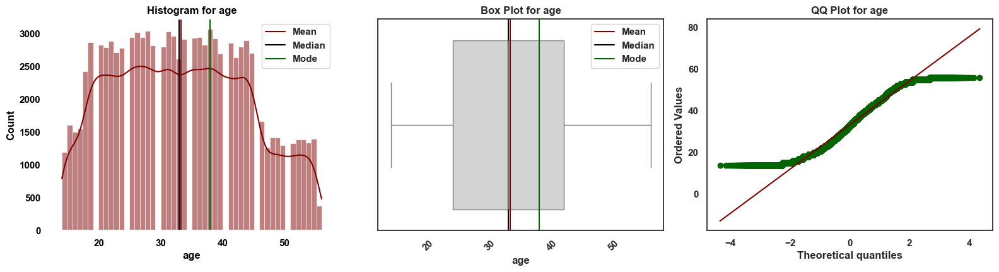



Skew for age is 0.1563
Kurtosis for age is -0.9268




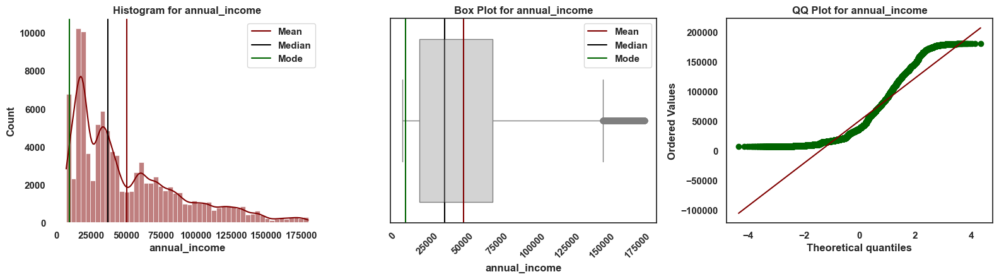



Skew for annual_income is 1.1302
Kurtosis for annual_income is 0.6082




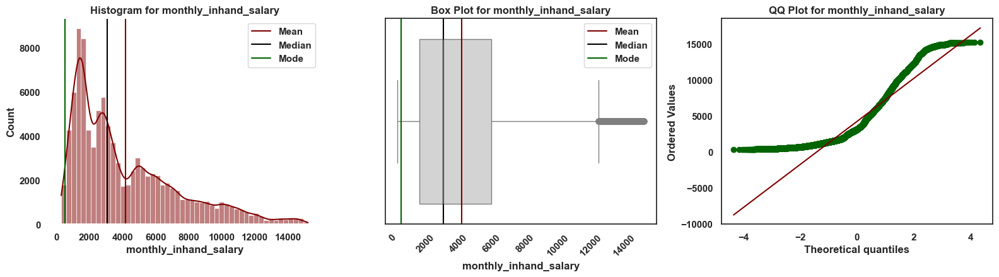



Skew for monthly_inhand_salary is 1.1287
Kurtosis for monthly_inhand_salary is 0.6174




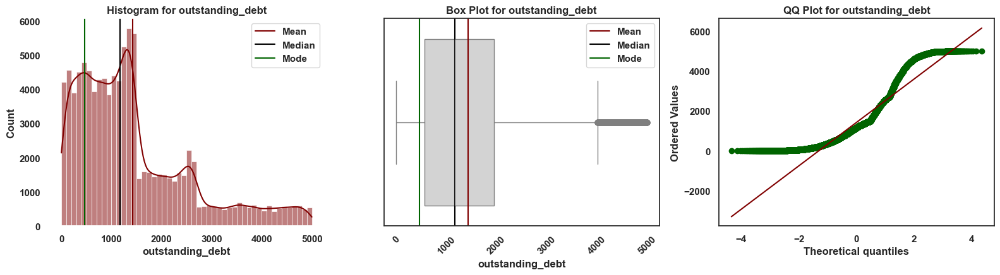



Skew for outstanding_debt is 1.2075
Kurtosis for outstanding_debt is 0.9050




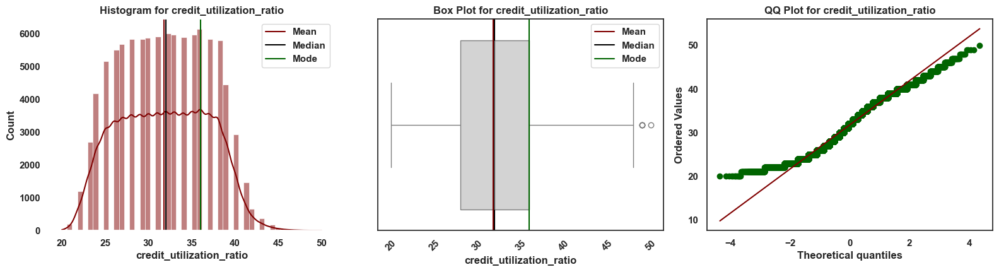



Skew for credit_utilization_ratio is 0.0291
Kurtosis for credit_utilization_ratio is -0.9368




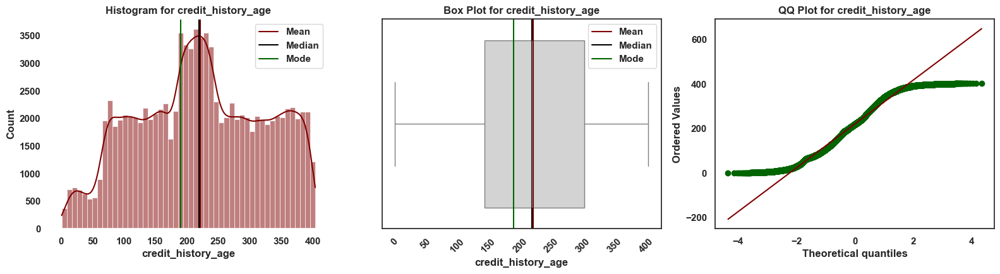



Skew for credit_history_age is -0.0488
Kurtosis for credit_history_age is -0.9022




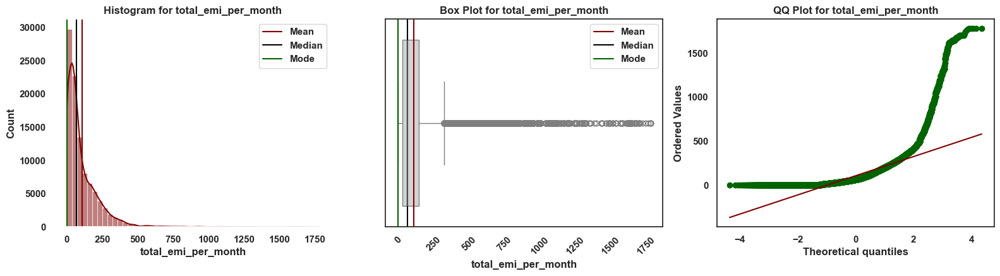



Skew for total_emi_per_month is 4.0415
Kurtosis for total_emi_per_month is 29.7831




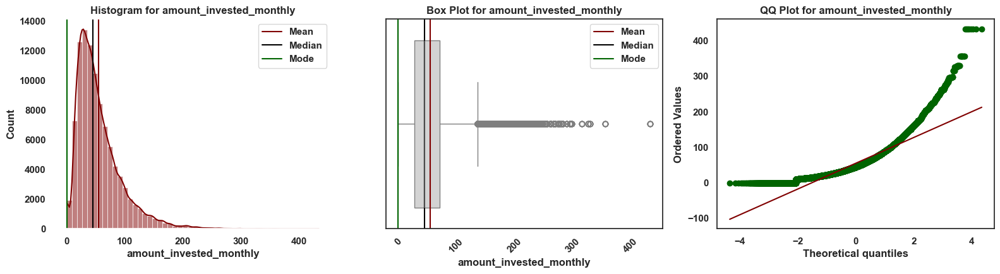



Skew for amount_invested_monthly is 1.7610
Kurtosis for amount_invested_monthly is 5.0253




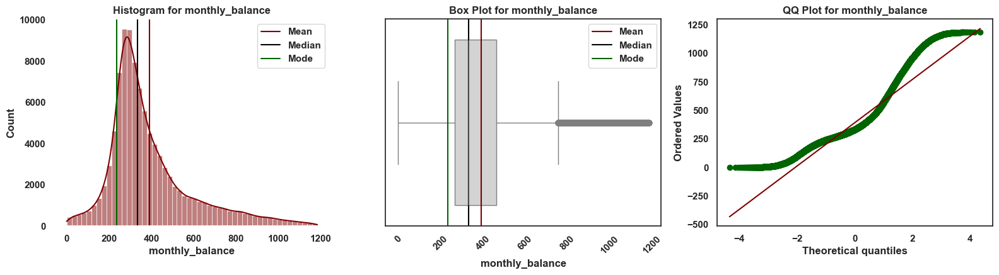



Skew for monthly_balance is 1.3556
Kurtosis for monthly_balance is 1.8883




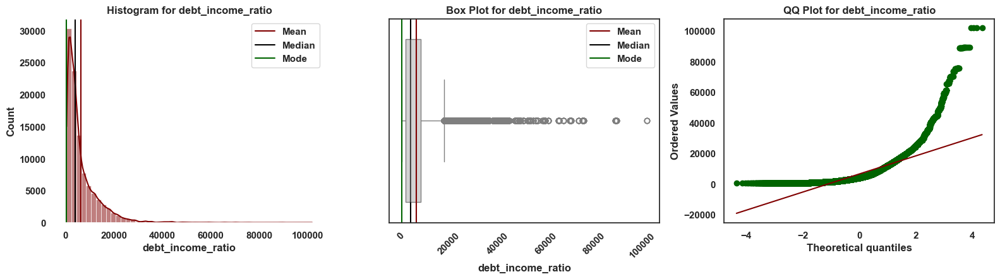



Skew for debt_income_ratio is 3.0382
Kurtosis for debt_income_ratio is 16.8082




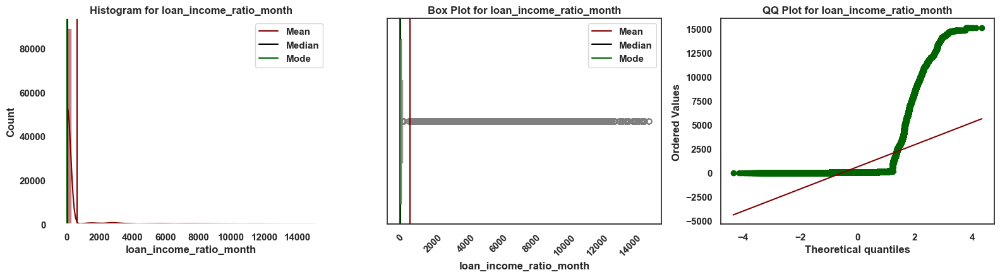



Skew for loan_income_ratio_month is 4.1611
Kurtosis for loan_income_ratio_month is 18.0425




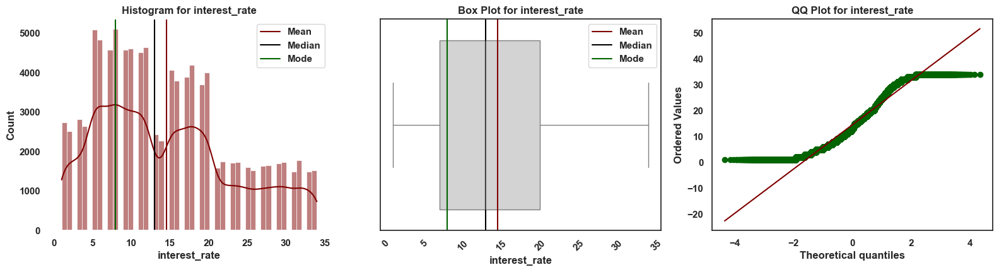



Skew for interest_rate is 0.4962
Kurtosis for interest_rate is -0.6819




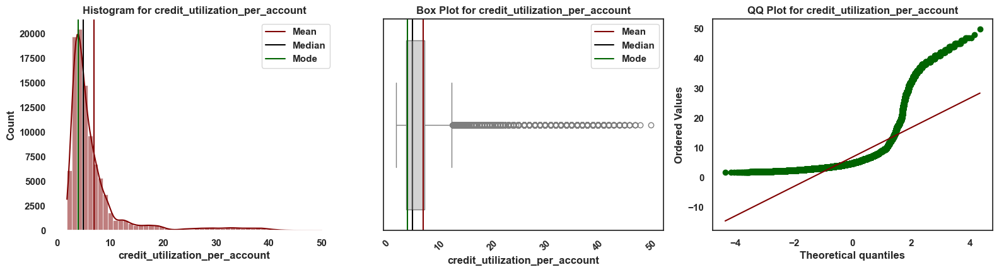



Skew for credit_utilization_per_account is 3.2312
Kurtosis for credit_utilization_per_account is 11.1977




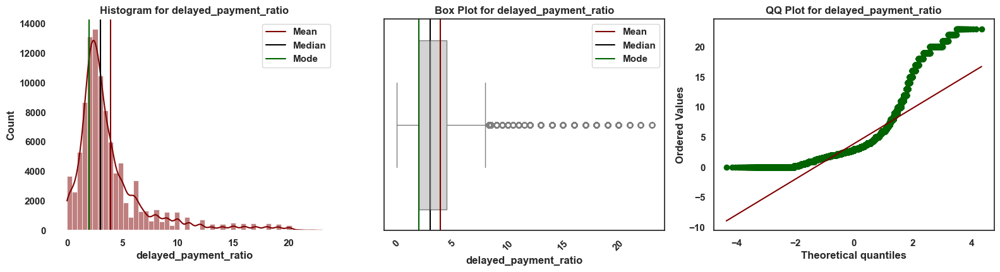



Skew for delayed_payment_ratio is 2.3763
Kurtosis for delayed_payment_ratio is 6.6450




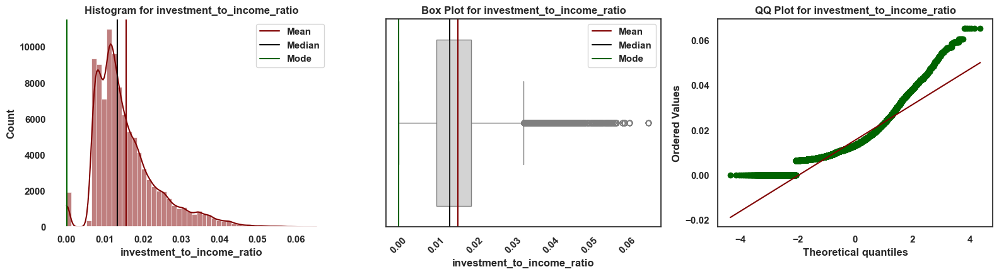



Skew for investment_to_income_ratio is 1.3715
Kurtosis for investment_to_income_ratio is 2.4119




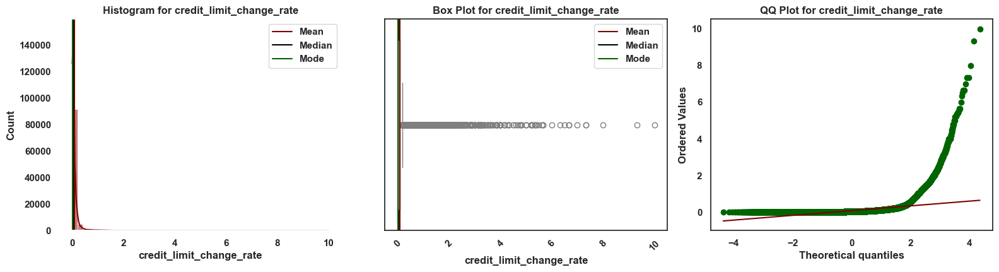



Skew for credit_limit_change_rate is 11.3453
Kurtosis for credit_limit_change_rate is 219.5843




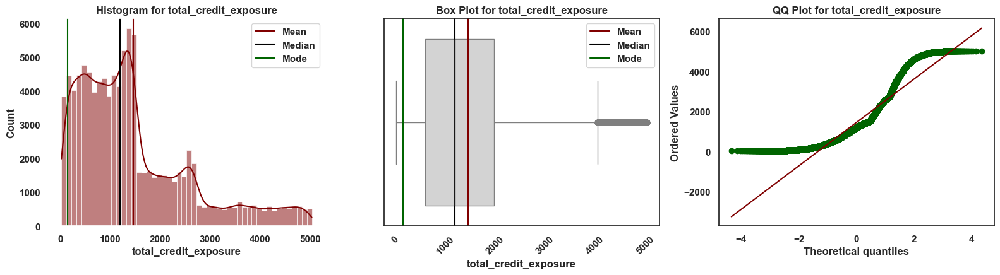



Skew for total_credit_exposure is 1.2078
Kurtosis for total_credit_exposure is 0.9062




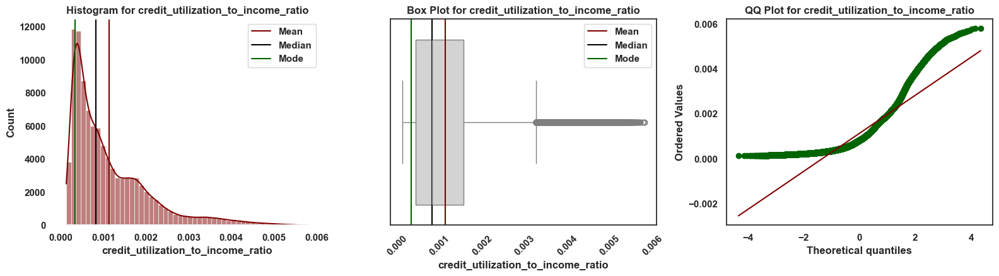



Skew for credit_utilization_to_income_ratio is 1.6149
Kurtosis for credit_utilization_to_income_ratio is 2.7111




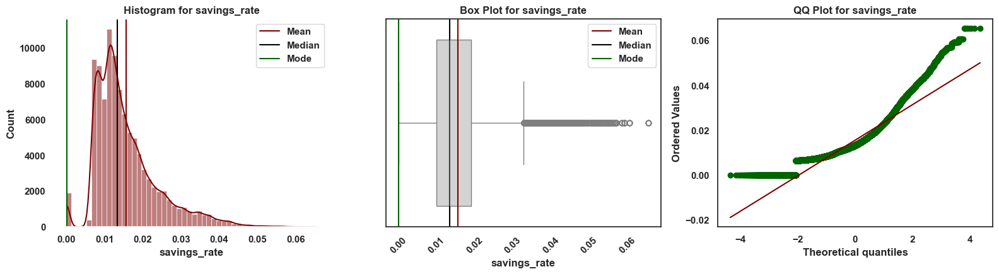



Skew for savings_rate is 1.3725
Kurtosis for savings_rate is 2.4142




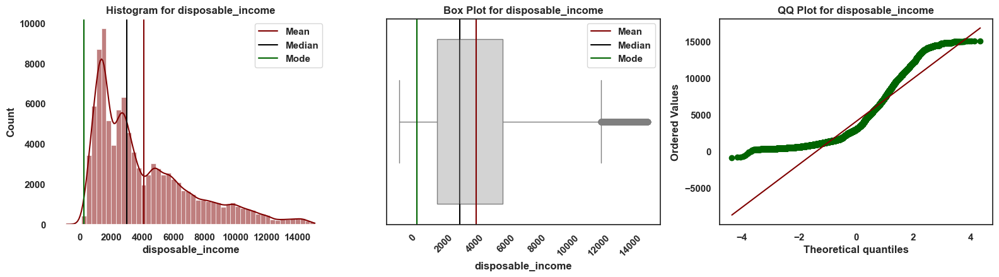



Skew for disposable_income is 1.1504
Kurtosis for disposable_income is 0.6806




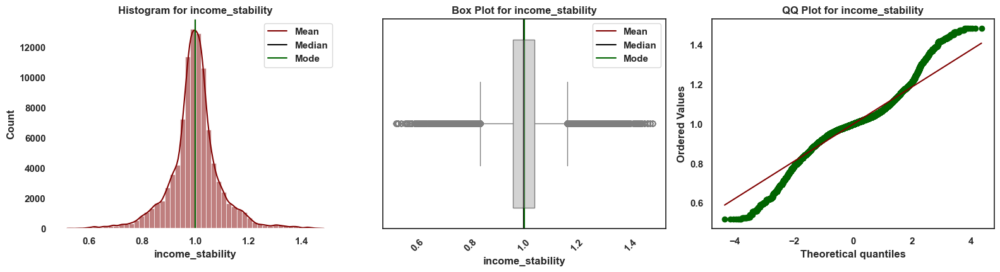



Skew for income_stability is 0.0909
Kurtosis for income_stability is 3.2810




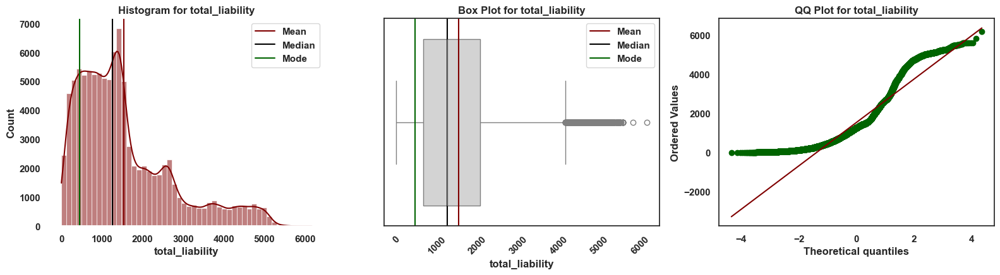



Skew for total_liability is 1.2003
Kurtosis for total_liability is 0.8952




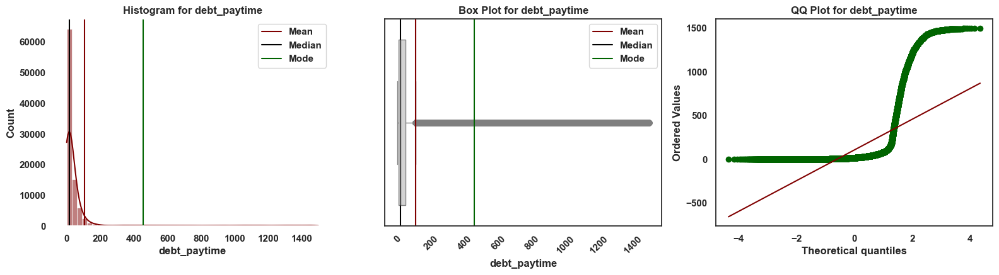



Skew for debt_paytime is 3.4513
Kurtosis for debt_paytime is 11.1968




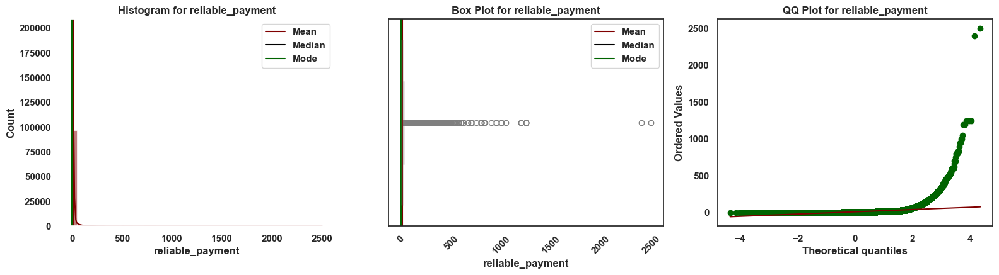



Skew for reliable_payment is 21.7870
Kurtosis for reliable_payment is 1007.5103




In [58]:
skewed_col = []


for i in continuous:
    univar_num(df,i) 
    skew_val = df[i].skew()
    kurt=df[i].kurtosis()
    kurt_color = kurtosis_color(kurt)
    color = skewness_color(skew_val)
    skewed_col.append(i)

    print(f"\n\n{color}Skew for {i} is {skew_val:.4f}{color_neutral}")
    print(f"{color}Kurtosis for {i} is {kurt:.4f}{color_neutral}\n\n")

#### <span style="color:Khaki;"> Observations and insights from plots above:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Histogram (First Plot) -**</span> A histogram is like a bar chart showing how often different values occur in your data. A smooth line (KDE) estimating the shape of data distribution.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Box-and-Whisker plot, (Second Plot) -**</span> The "box" represents the middle 50% of your data. The line in the middle of the box is the median. The "whiskers" extend to show the rest of the distribution.Points beyond the whiskers are potential outliers.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Q-Q Plot (Quantile-Quantile (Third plot)): -**</span> This plot compares your data's distribution to a theoretical normal distribution. It show how closely your data follows a normal distribution and Where and how your data deviates from normality.
   



   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Observations: -**</span> 
      - All features are right skewed (right tail) except `credit_utilization_ratio`, `credit_history_age`, `interest_rate`,`income_stability`. 
      - Effect of Skewness, we have outliers after the upper whisker (right side of the box plot).
      - Q-Q plot also confirms the same from the data deviation. The red line on the Q-Q plot is therotical line of Normal distribution and the green line is our data distrinbution.
      - All of these explains the presence of larger values but in smaller quantities.

<span style="color: Chartreuse;font-size: 130%">&#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <b>We will need to use appropriate techniques like normalizing, capping outliers to certain percentile, etc, to address these issues</b></span>

### <span style="color:Khaki;">Statistival Test for Normality, Skew, Kurtosis:

Performing statustival test to confirm

In [59]:
for var in continuous:
    stat, p = kstest(df[var], 'norm', args=(df[var].mean(), df[var].std()))
    print(f'K-S Test for {var}: Statistics={stat}, p={p}')
    if p > 0.05:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')


K-S Test for age: Statistics=0.06333800275302293, p=0.0
age does not look normally distributed.

K-S Test for annual_income: Statistics=0.14203315204670652, p=0.0
annual_income does not look normally distributed.

K-S Test for monthly_inhand_salary: Statistics=0.14067914495519357, p=0.0
monthly_inhand_salary does not look normally distributed.

K-S Test for outstanding_debt: Statistics=0.1576940779266306, p=0.0
outstanding_debt does not look normally distributed.

K-S Test for credit_utilization_ratio: Statistics=0.07522803037797016, p=0.0
credit_utilization_ratio does not look normally distributed.

K-S Test for credit_history_age: Statistics=0.04701729085776474, p=1.5166792217978926e-192
credit_history_age does not look normally distributed.

K-S Test for total_emi_per_month: Statistics=0.20774923359207237, p=0.0
total_emi_per_month does not look normally distributed.

K-S Test for amount_invested_monthly: Statistics=0.11635316180823785, p=0.0
amount_invested_monthly does not look no

In [60]:
for var in continuous:
    skewness = skew(df[var])
    kurt = kurtosis(df[var])
    print(f'{var} - Skewness: {skewness}, Kurtosis: {kurt}')
    if abs(skewness) < 0.5 and abs(kurt) < 3:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')

age - Skewness: 0.15633520591857253, Kurtosis: -0.9268249487967637
age looks normally distributed.

annual_income - Skewness: 1.1302056133322436, Kurtosis: 0.6080616287066642
annual_income does not look normally distributed.

monthly_inhand_salary - Skewness: 1.1286726799893096, Kurtosis: 0.6172697245812087
monthly_inhand_salary does not look normally distributed.

outstanding_debt - Skewness: 1.2075180824515632, Kurtosis: 0.9048784417856148
outstanding_debt does not look normally distributed.

credit_utilization_ratio - Skewness: 0.02908361356871466, Kurtosis: -0.93682415510728
credit_utilization_ratio looks normally distributed.

credit_history_age - Skewness: -0.04883093164669138, Kurtosis: -0.9021892367398672
credit_history_age looks normally distributed.

total_emi_per_month - Skewness: 4.04143162144064, Kurtosis: 29.781598859016853
total_emi_per_month does not look normally distributed.

amount_invested_monthly - Skewness: 1.761009815009086, Kurtosis: 5.024956143518471
amount_inv

<span style="color: Chartreuse;font-size: 130%">&#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <b>Above are the another way of checking distribution and Skewness, it representing the same results as plots.</b></span>

### <span style="color:Khaki;">Categorical features Distribution

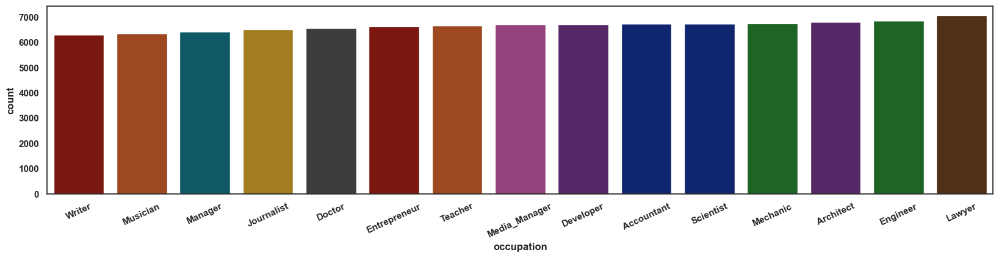

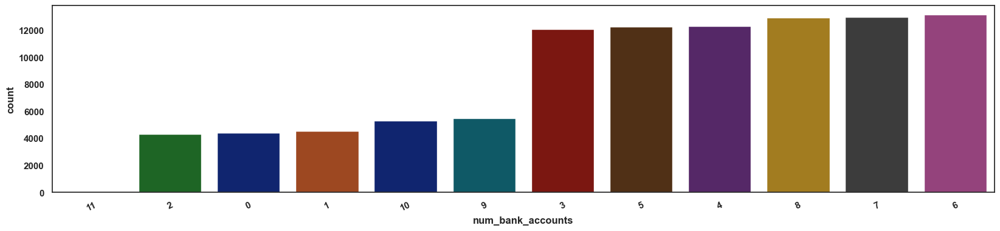

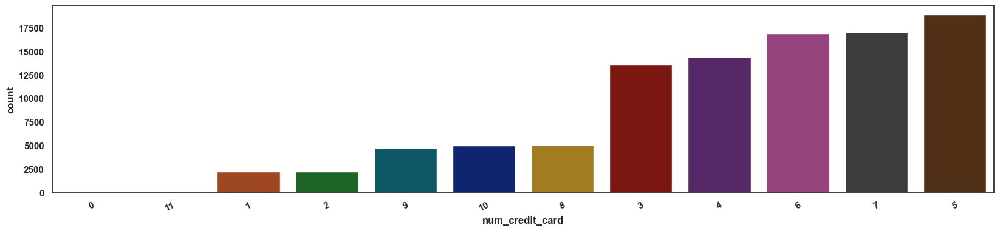

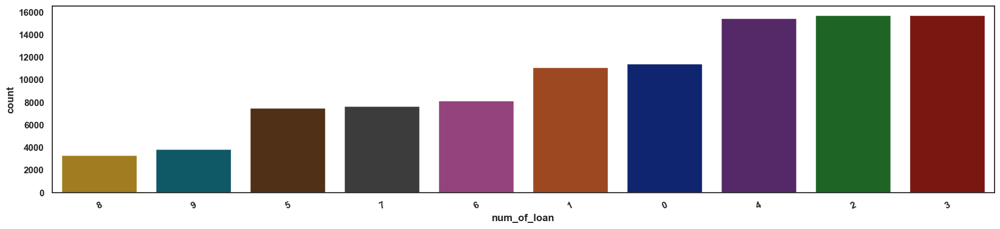

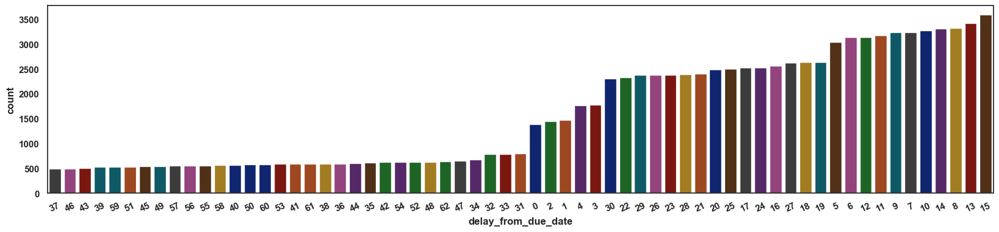

...

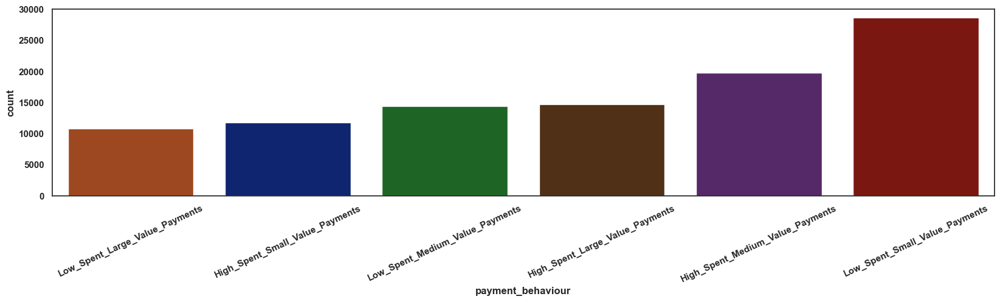

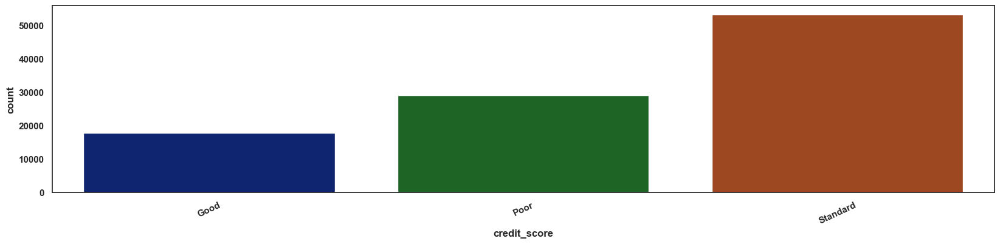

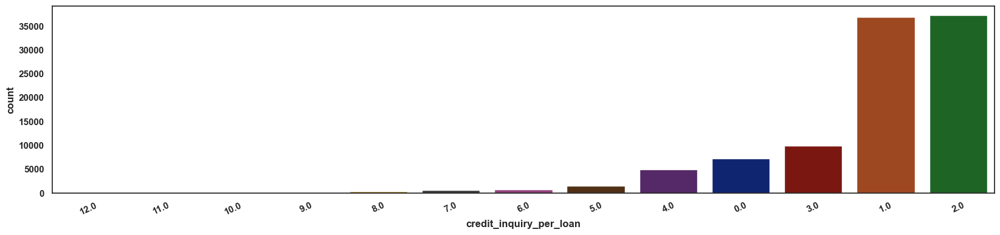

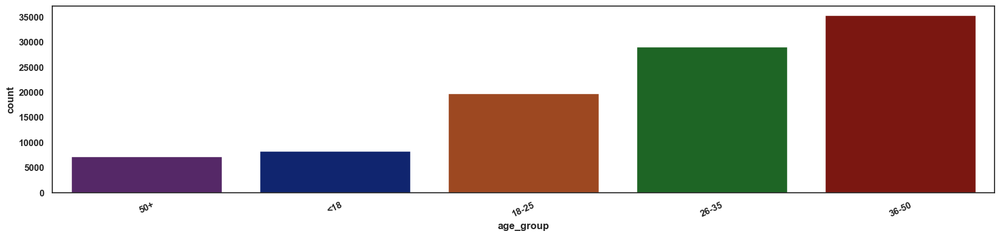

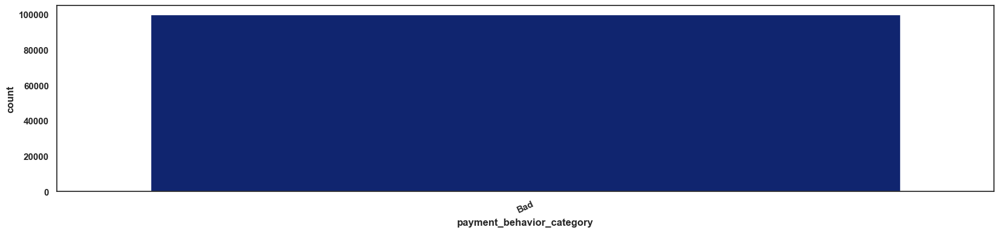

In [61]:
for i in categorical:
    plt.figure(figsize=(20, 4))
    sns.countplot(data=df, x=df[i], hue=i, order = df[i].value_counts().index.tolist()[::-1],palette='dark',legend=False)
    plt.xticks(rotation=25)

#### <span style="color:Khaki;"> Insights from Categorical Variables distribution:</span>

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Bank Accounts: -**</span>  Most people have 3 to 9 bank accounts.

   - <span style="color: Tomato;font-fa mily:calibri;font-size:130%">**Credit Cards: -**</span> Most people have 3 to 8 credit cards.
   
   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Loans -**</span> Most people have 2 to 4 loans.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Payment Behavior: -**</span> Most people pay the minimum due. This group is a key target for our problem statement (target people for the bank).

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Credit Scores: -**</span> Most people have a standard credit score, likely those who pay only the minimum dues.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Loan Enquiries: -**</span> The largest audience consists of people with low loan enquiries.

   - <span style="color: Tomato;font-family:calibri;font-size:130%">**Age Distribution: -**</span> Most of the audience is aged between 36 and 50. There is a non-linear relationship observed, with minimal representation from those below 18 and above 50. The mid-age group constitutes the majority.

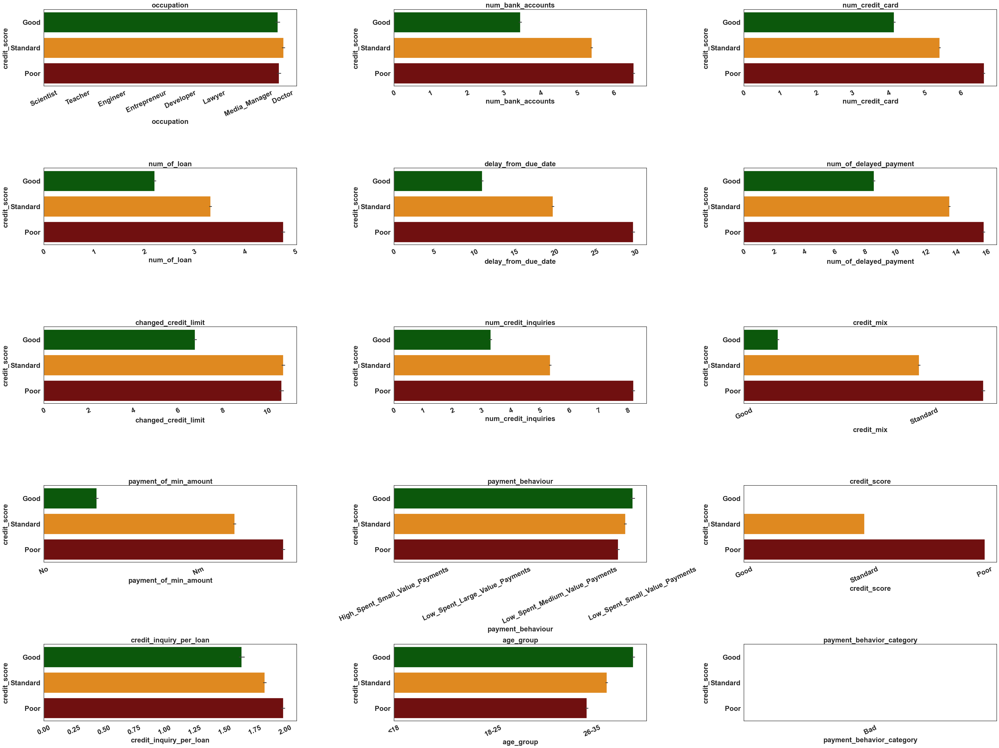

In [68]:
fig, axes = plt.subplots(ncols=3, nrows = int(np.ceil(len(categorical)/3)), figsize=(40, 30))

for i, col in enumerate(categorical):
    if i != 'credit_score':
        sns.barplot(data=df, x=col, y='credit_score', hue="credit_score",hue_order=['Good','Standard','Poor'],orient='h',palette=['DarkGreen','darkorange','maroon'], legend=False,ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(col, weight='bold', fontsize=20)  # Explicitly set title font weight and size
        axes[i//3, i%3].tick_params(axis='x', rotation=25, labelsize=20)  # Set xtick label size
        axes[i//3, i%3].tick_params(axis='y', labelsize=20)  # Set ytick label size
        axes[i//3, i%3].set_xlabel(col, fontsize=20, weight='bold')  # Set xlabel size and weight
        axes[i//3, i%3].set_ylabel('credit_score', fontsize=20, weight='bold')  # Set ylabel size and weight
    
plt.tight_layout()
plt.show()

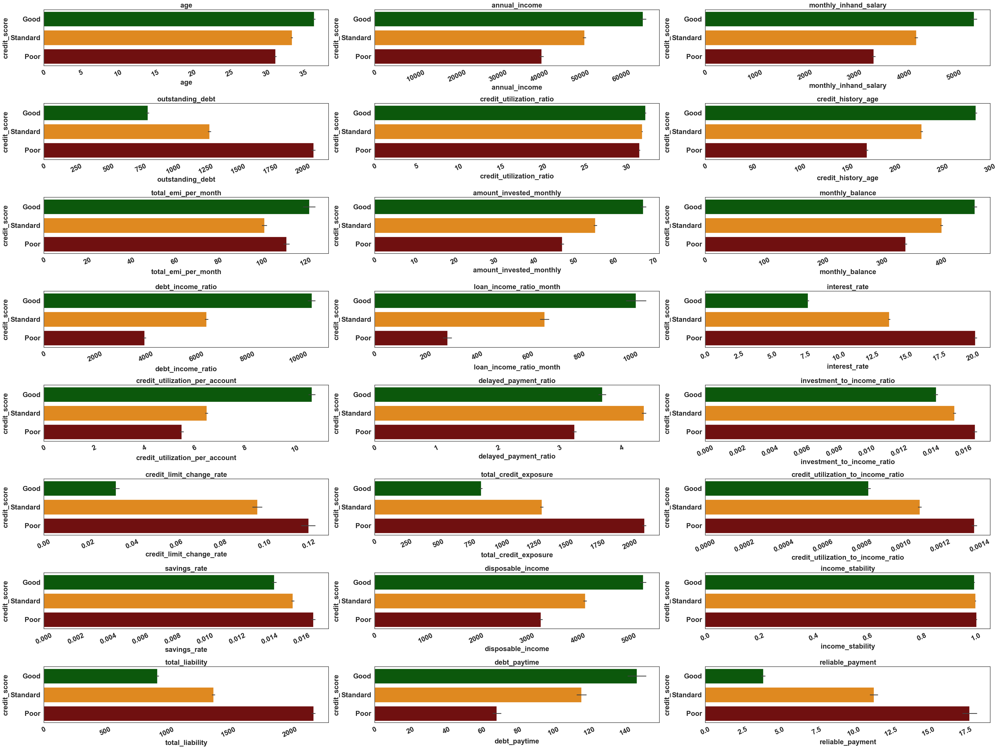

In [69]:
fig, axes = plt.subplots(ncols=3, nrows = int(np.ceil(len(continuous)/3)), figsize=(40, 30))


for i, col in enumerate(continuous):
    if i != 'credit_score':
        sns.barplot(data=df, x=col, y='credit_score', hue="credit_score",hue_order=['Good','Standard','Poor'],orient='h',palette=['DarkGreen','darkorange','maroon'], legend=False,ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(col)
        axes[i//3, i%3].tick_params(axis='x', rotation=25)
        axes[i//3, i%3].set_title(col, weight='bold', fontsize=20)  # Explicitly set title font weight and size
        axes[i//3, i%3].tick_params(axis='x', rotation=25, labelsize=20)  # Set xtick label size
        axes[i//3, i%3].tick_params(axis='y', labelsize=20)  # Set ytick label size
        axes[i//3, i%3].set_xlabel(col, fontsize=20, weight='bold')  # Set xlabel size and weight
        axes[i//3, i%3].set_ylabel('credit_score', fontsize=20, weight='bold')  # Set ylabel size and weight
    
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Credit Scores Based on Annual Income')

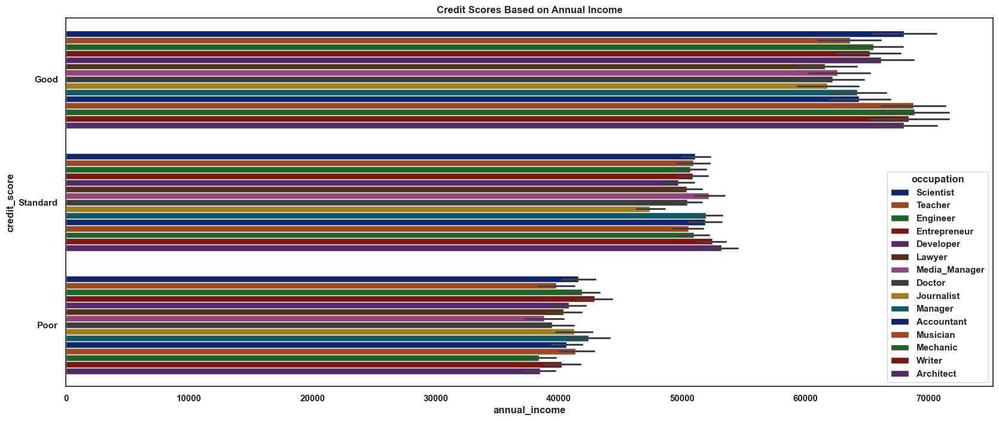

In [81]:
plt.figure(figsize=(20,8))
sns.barplot(data=df,x='annual_income', y='credit_score',hue='occupation',palette='dark')
plt.title("Credit Scores Based on Annual Income")

### <span style="color:Khaki;">Pair Plot</span>

In [84]:
plt.figure(figsize=(20,30))
sns.pairplot(data=df[categorical] , hue = 'credit_score')
plt.show()

In [ ]:
plt.figure(figsize=(20,30))
sns.pairplot(data=df[continuous] , hue = 'credit_score')
plt.show()

### <span style="color:Khaki;">Resale Price by Lease Commence Date and Flat Type </span> 

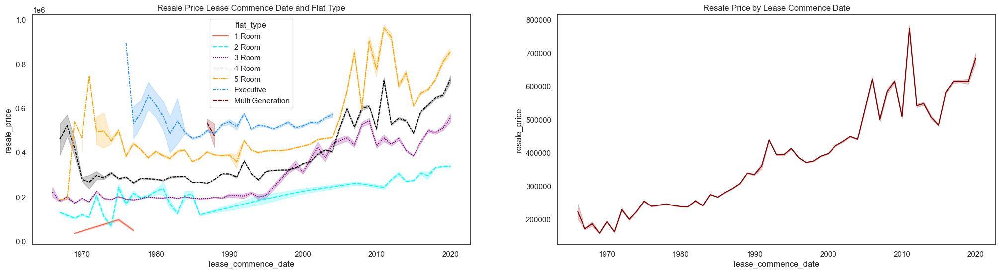

In [65]:
plt.figure(figsize=(25,6))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',hue='flat_type',style="flat_type",palette=['Tomato','aqua','purple','black','Orange','DodgerBlue','maroon'])
plt.title("Resale Price Lease Commence Date and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',color='maroon')
plt.title("Resale Price by Lease Commence Date")

plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Line plot also confirms the overall increasing trend with fluctuations.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Price starts based on the Flat type. Small room from the bottom with increasing trend. This is indicating the price variance in the flat type.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Also we can observe fewer data points over a period of year. 1 Room starts from 1968 and ends in 1978. Executive flats starts with high price 1975 and ends in 2003. Multi Generation also started high price initially in the 1986 and ends in 1989 in the decreasing trend.**</span>

### <p Style="color: khaki;">Resale Price by Year and Flat Type</p>

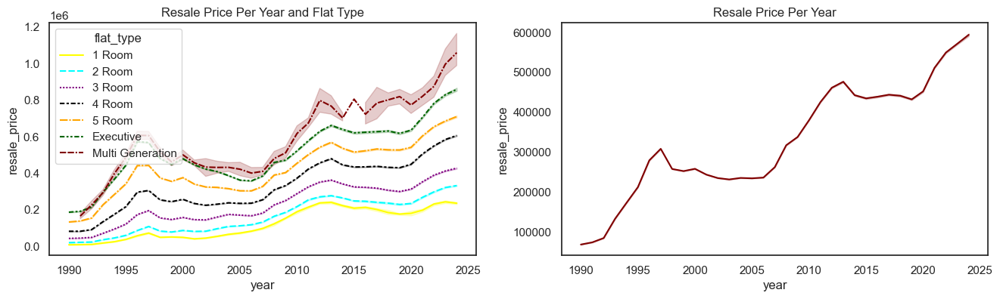

In [66]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='year', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Per Year and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Irrespective of flat type overall price goes in increasing trend while year increases.**</span>

### <p Style="color: Khaki">Resale Price by no of floors and Flat Type </p>

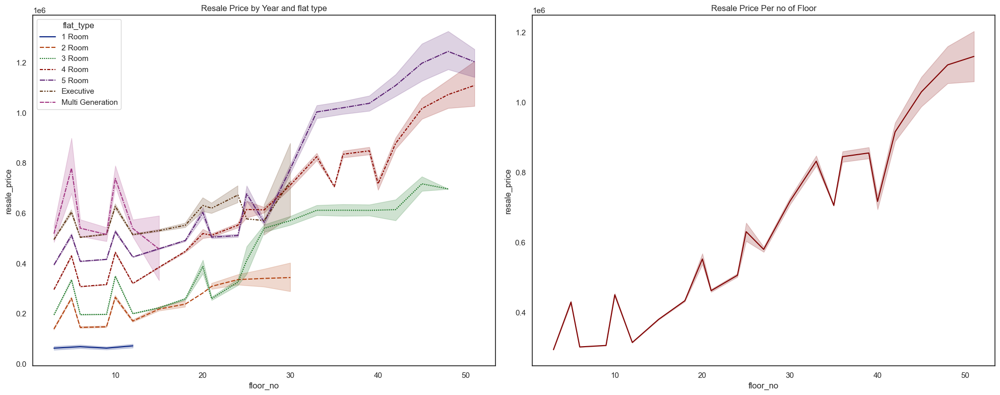

In [67]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='floor_no', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and flat type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='floor_no', y = 'resale_price',color='maroon')
plt.title("Resale Price Per no of Floor")
plt.tight_layout()
plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Line plot also confirms the overall increasing trend with fluctuations while floor level increases.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Price starts based on the floor level. Small low floor starts from the bottom with increasing trend. This is indicating the price variance in the floor level.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Premium flats floor level is above 40. Other flats are below floor level 40.**</span>

### <p Style="color: Khaki">Resale Price by remaining_lease_year and Flat Type

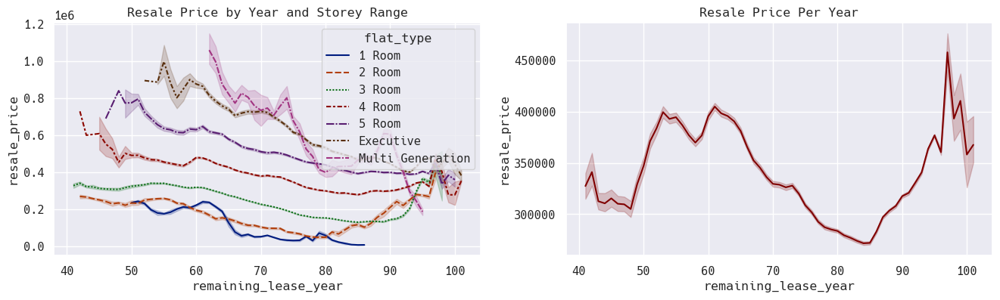

In [68]:
sns.set_theme( font_scale=1,font='Hack Nerd Font')

plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### <p Style="color: Khaki">Correlation - Pearson's and Spearman's </p>

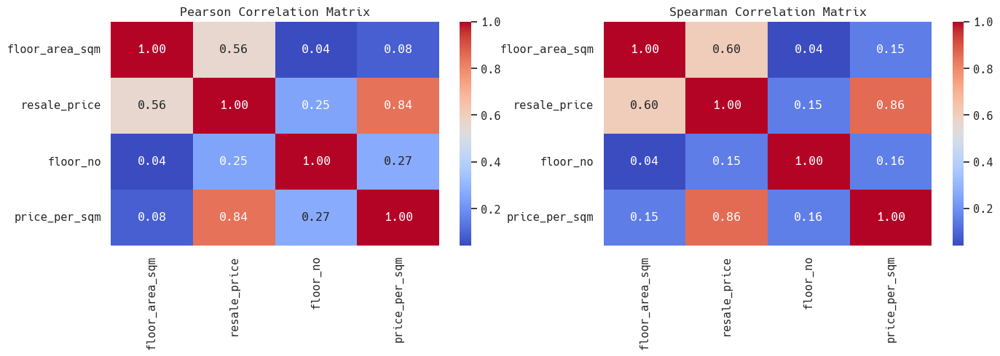

In [69]:
cor_col = df1.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Pearson Correlation Matrix')


cor_col = df1.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
plt.subplot(1,2,2)
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Spearman Correlation Matrix')
plt.show()

## <p Style="color: Khaki"> Data Transformation:

### <p Style="color: Khaki">Experimenting with a few types of data transformation techniques to see which one suits best.

#### <p Style="color: Aqua"> Defining a function to perform Box-Cox and Applying

In [53]:
def boxcox_transform(x):
    transformed_data,lmbda = boxcox(x)
    return transformed_data,lmbda

In [43]:
method_functions =  {
    'log': np.log,
    'square': np.sqrt,
    'rec': lambda x: 1 / x,
    'sig': lambda x: 1 / (1 + np.exp(-x)),
    'pow': lambda x: np.power(x, 2),
    'exp':lambda x: x**(1/5),
    'boxcox': boxcox_transform,
        }

def skewness_checker(df, column, method):
    normalized_df=pd.DataFrame()

    for method_name, func in method_functions.items():
        for col in column:

            new_column = f'{col}_{method_name}'
            if method_name in ['boxcox']:
                transformed_values = func(df[col])[0]
            else:
                transformed_values = func(df[col])
            normalized_df[new_column] = transformed_values

    return normalized_df

#### <p Style="color: Aqua"> Created a new Data Frame that contains transformed values:

In [44]:
normalized_df=skewness_checker(df1, continuous, method_functions)
normalized_df.sample(5)

,floor_area_sqm_log,resale_price_log,floor_area_sqm_square,resale_price_square,floor_area_sqm_rec,resale_price_rec,floor_area_sqm_sig,resale_price_sig,floor_area_sqm_pow,resale_price_pow,floor_area_sqm_exp,resale_price_exp,floor_area_sqm_boxcox,resale_price_boxcox
56482,4.174387,11.608236,8.062258,331.662479,0.015385,0.000009,1.0,1.0,4225.0,1.210000e+10,2.304532,10.192449,9.363559,368.361477
33530,4.304065,12.853176,8.602325,618.061486,0.013514,0.000003,1.0,1.0,5476.0,1.459240e+11,2.365083,13.074126,9.926002,637.564784
82023,4.804021,12.542545,11.045361,529.150262,0.008197,0.000004,1.0,1.0,14884.0,7.840000e+10,2.613798,12.286597,12.346850,556.073878
166976,4.304065,11.842229,8.602325,372.827038,0.013514,0.000007,1.0,1.0,5476.0,1.932100e+10,2.365083,10.680780,9.926002,408.417618
51601,4.955827,12.868761,11.916375,622.896460,0.007042,0.000003,1.0,1.0,20164.0,1.505440e+11,2.694373,13.114941,13.168743,641.953076


#### <p Style="color: Aqua"> Plotting all type of transformed values:

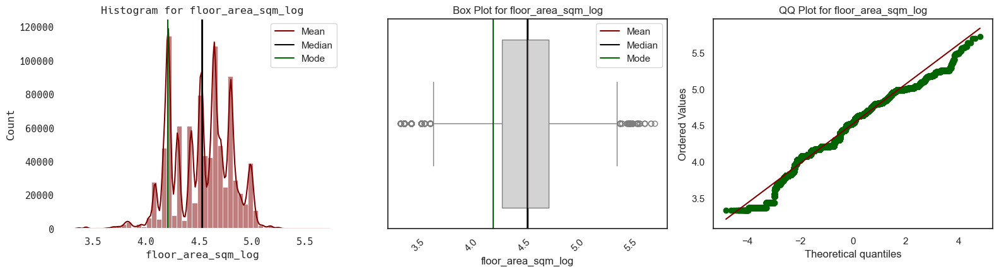



Skew for floor_area_sqm_log is -0.23

Kurtosis for floor_area_sqm_log is -0.36




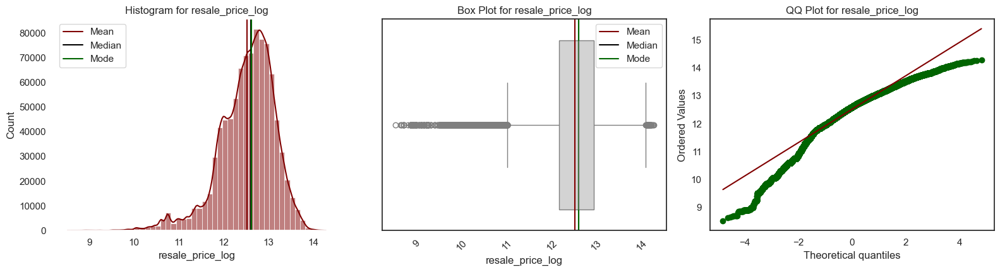



Skew for resale_price_log is -0.92

Kurtosis for resale_price_log is 1.61




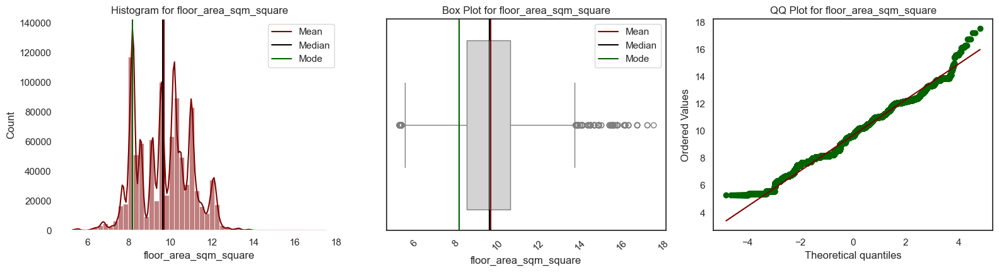



Skew for floor_area_sqm_square is 0.08

Kurtosis for floor_area_sqm_square is -0.57




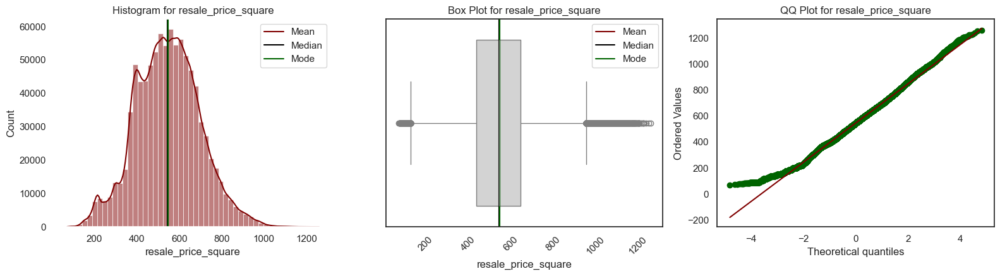



Skew for resale_price_square is 0.11

Kurtosis for resale_price_square is 0.05




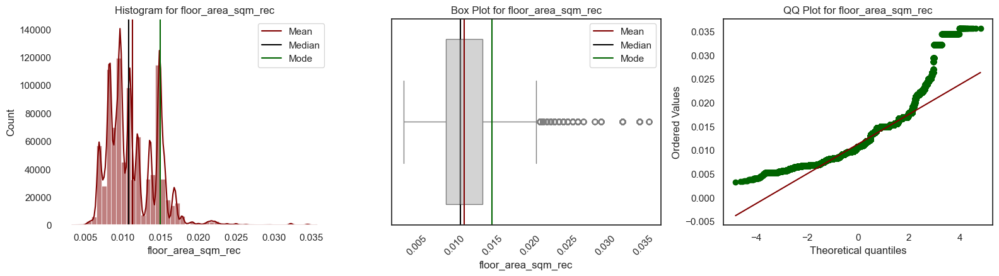



Skew for floor_area_sqm_rec is 1.10

Kurtosis for floor_area_sqm_rec is 3.00




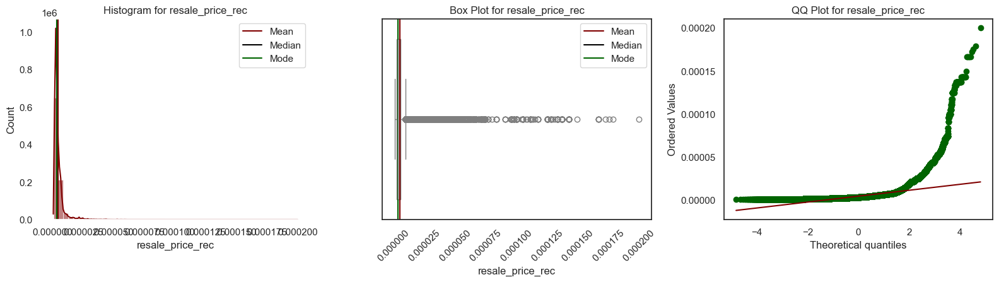



Skew for resale_price_rec is 7.24

Kurtosis for resale_price_rec is 112.40




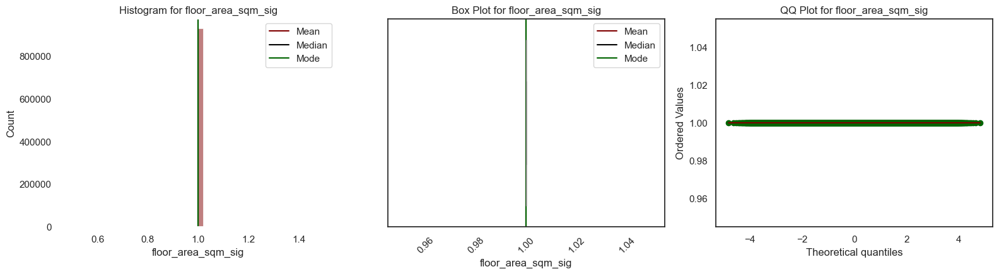



Skew for floor_area_sqm_sig is 0.00

Kurtosis for floor_area_sqm_sig is 0.00




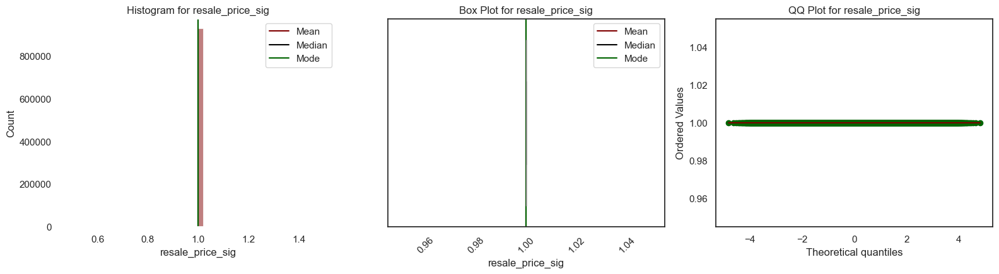



Skew for resale_price_sig is 0.00

Kurtosis for resale_price_sig is 0.00




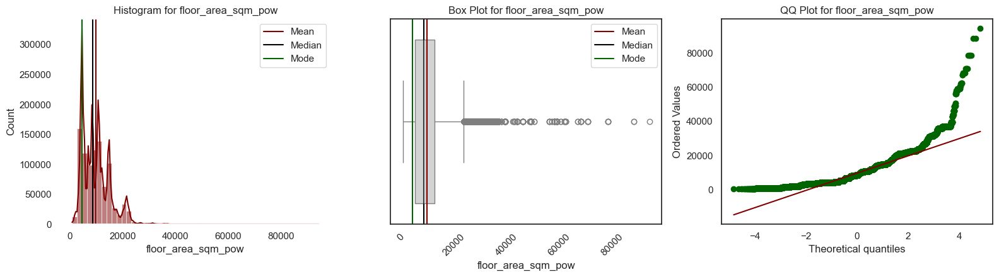



Skew for floor_area_sqm_pow is 1.00

Kurtosis for floor_area_sqm_pow is 1.66




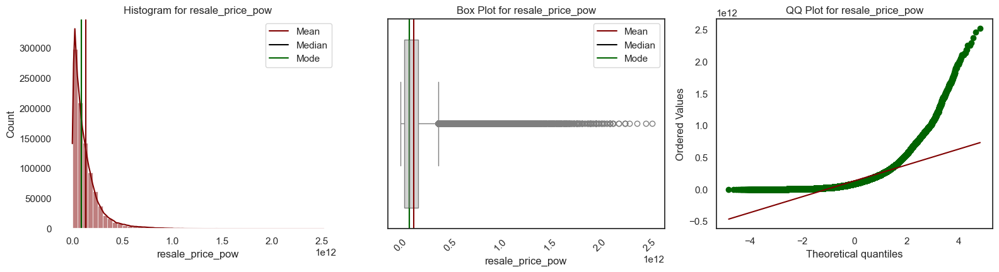



Skew for resale_price_pow is 2.81

Kurtosis for resale_price_pow is 13.23




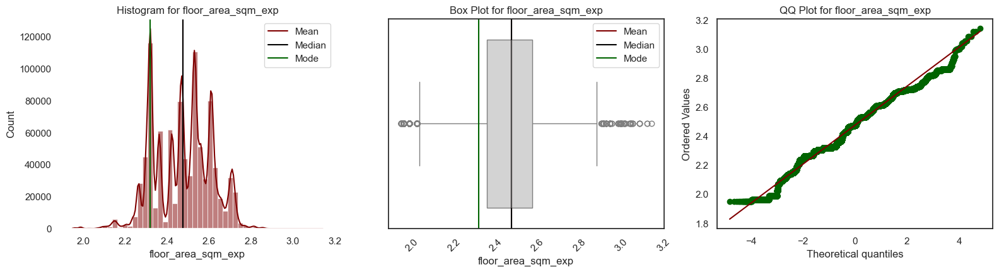



Skew for floor_area_sqm_exp is -0.11

Kurtosis for floor_area_sqm_exp is -0.50




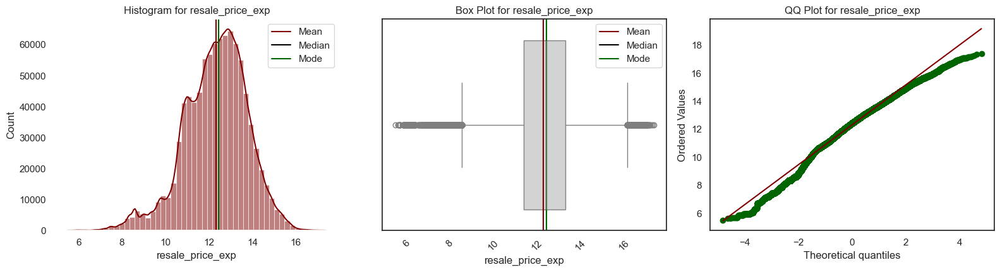



Skew for resale_price_exp is -0.46

Kurtosis for resale_price_exp is 0.48




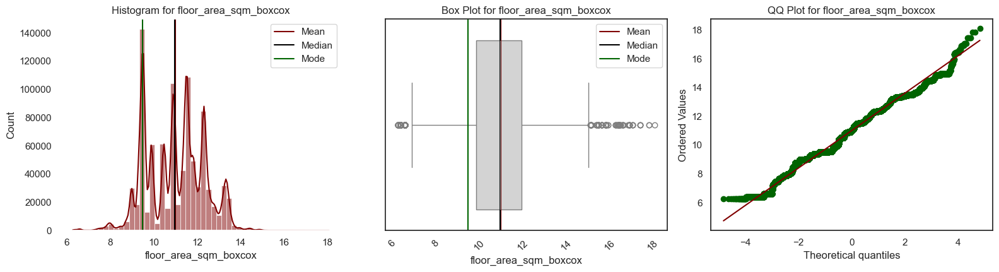



Skew for floor_area_sqm_boxcox is -0.02

Kurtosis for floor_area_sqm_boxcox is -0.55




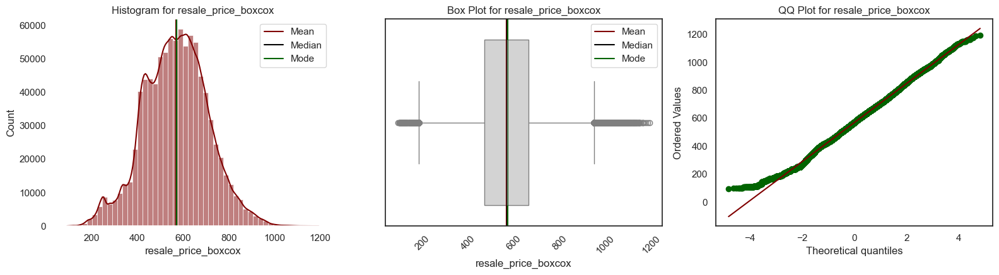



Skew for resale_price_boxcox is -0.00

Kurtosis for resale_price_boxcox is 0.05


Skewness:
 {'floor_area_sqm_log': -0.23334388, 'resale_price_log': -0.9240431018462136, 'floor_area_sqm_square': 0.07508402, 'resale_price_square': 0.10918464819090822, 'floor_area_sqm_rec': 1.1036736, 'resale_price_rec': 7.24332894254145, 'floor_area_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.0026332, 'resale_price_pow': 2.810519042318628, 'floor_area_sqm_exp': -0.10569635, 'resale_price_exp': -0.4641821320745675, 'floor_area_sqm_boxcox': -0.016471082, 'resale_price_boxcox': -0.0005540558944127643} 

 Kurtois:
 {'floor_area_sqm_log': -0.35770032, 'resale_price_log': 1.6050165886358765, 'floor_area_sqm_square': -0.56573135, 'resale_price_square': 0.04932580507928508, 'floor_area_sqm_rec': 3.003057, 'resale_price_rec': 112.3990151551124, 'floor_area_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.6554761, 'resale_price_pow': 13.227158328215623, 'floor_area_sqm_exp': -

In [45]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df.columns:
    univar_num(normalized_df,i)
    skews=normalized_df[i].skew()
    kurt=normalized_df[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)


<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> <b> Based on the skewness and kurtosis values, the <span Style="color:Aqua"> Box-Cox transformation </span>is the best choice for addressing outliers and normalizing the distributions of both floor_area_sqm and resale_price. This should improve the performance of your predictive models.</b></span>

### <p Style="color: Khaki"> Applying Box-Cox transformation to our data:

In [62]:
lambda_dict = {}

df1['resale_price_boxcox'] , lambda_dict['resale_price_lambda'] = boxcox_transform(df1['resale_price'] +1)
df1['floor_area_boxcox'] , lambda_dict['floor_area_lambda'] = boxcox_transform(df1['floor_area_sqm'] +1)

os.makedirs('pkls', exist_ok=True)
with open(r'pkls/boxcox_lambdas.pkl', 'wb') as f:
    pickle.dump(lambda_dict, f)

In [63]:
df1.sample(6)

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,floors,floor_no,year,full_address,price_per_sqm,remaining_lease_year,resale_price_boxcox,floor_area_boxcox
156342,7,Ang Mo Kio,3 Room,68.0,New Generation,1981,360000.0,3,12,2023,330 Ang Mo Kio Ave 1 Ang Mo Kio,5294.117647,57,621.115111,9.417597
360655,9,Jurong West,5 Room,115.0,Premium Apartment,2001,453000.0,3,3,2011,602 Jurong West St 62 Jurong West,3939.130435,89,687.213432,11.792935
334766,9,Bukit Merah,4 Room,92.0,New Generation,1978,470000.0,3,9,2010,65 Telok Blangah Dr Bukit Merah,5108.695652,67,698.444011,10.731296
58425,8,Pasir Ris,5 Room,125.0,Improved,1996,340000.0,3,12,2001,740 Pasir Ris St 71 Pasir Ris,2720.000000,94,605.682343,12.211020
75677,8,Jurong West,3 Room,74.0,Model A,1985,101000.0,3,3,1994,440 Jurong West Ave 1 Jurong West,1364.864865,90,354.734129,9.771330
80198,9,Yishun,3 Room,68.0,New Generation,1984,265000.0,3,3,2020,138 Yishun Ring Rd Yishun,3897.058824,63,542.736522,9.417597


## <p Style="color:Khaki"> Exploratory Data Analysis. After Handling Skewness and Outliers

In [17]:
continuous = ['floor_area_sqm', 'resale_price','resale_price_boxcox','floor_area_boxcox']


In [24]:
df1[df1.resale_price>1400000]

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,floors,floor_no,year,full_address,price_per_sqm,remaining_lease_year
133147,7,Queenstown,5 Room,122.0000,Premium Apartment Loft,2016,1418000.0000,3,39,2022,92 Dawson Rd Queenstown,11622.9508,93
154815,6,Bukit Merah,4 Room,176.0000,Adjoined Flat,1973,1500000.0000,3,6,2023,50 Moh Guan Ter Bukit Merah,8522.7273,49
156056,6,Toa Payoh,5 Room,117.0000,Dbss,2012,1420000.0000,3,42,2023,139B Lor 1A Toa Payoh Toa Payoh,12136.7521,88
159010,8,Central Area,4 Room,94.0000,Type S1,2011,1410000.0000,3,51,2023,1B Cantonment Rd Central Area,15000.0000,87
159017,8,Central Area,5 Room,107.0000,Type S2,2011,1480000.0000,3,30,2023,1D Cantonment Rd Central Area,13831.7757,87
160483,8,Toa Payoh,5 Room,114.0000,Dbss,2012,1460000.0000,3,42,2023,139B Lor 1A Toa Payoh Toa Payoh,12807.0175,88
161046,9,Bishan,5 Room,120.0000,Dbss,2011,1430000.0000,3,36,2023,273B Bishan St 24 Bishan,11916.6667,87
161051,9,Bishan,Executive,172.0000,Maisonette,1992,1450000.0000,3,21,2023,278 Bishan St 24 Bishan,8430.2326,68
161228,9,Bukit Merah,5 Room,113.0000,Improved,2019,1430000.0000,3,36,2023,95C Henderson Rd Bukit Merah,12654.8673,95
163271,10,Bukit Merah,5 Room,113.0000,Improved,2019,1450000.0000,3,21,2023,96A Henderson Rd Bukit Merah,12831.8584,95


In [8]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
floor_area_sqm,927465.0,95.6912,25.8250,28.0000,73.0000,93.0000,113.0,3.0700e+02
resale_price,927465.0,320848.0588,170522.8573,5000.0000,193000.0000,297500.0000,418000.0,1.5880e+06
floor_no,927465.0,8.6972,4.8221,3.0000,6.0000,9.0000,12.0,5.1000e+01
price_per_sqm,927465.0,3318.1377,1532.1337,161.2903,2292.2609,2956.5217,4200.0,1.5591e+04


In [66]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 15 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   month                 927465 non-null  category
 1   town                  927465 non-null  category
 2   flat_type             927465 non-null  category
 3   floor_area_sqm        927465 non-null  float64 
 4   flat_model            927465 non-null  category
 5   lease_commence_date   927465 non-null  category
 6   resale_price          927465 non-null  float64 
 7   floors                927465 non-null  category
 8   floor_no              927465 non-null  int8    
 9   year                  927465 non-null  category
 10  full_address          927465 non-null  category
 11  price_per_sqm         927465 non-null  float64 
 12  remaining_lease_year  927465 non-null  category
 13  resale_price_boxcox   927465 non-null  float64 
 14  floor_area_boxcox     927465 non-null  fl

In [67]:
df1.shape

(927465, 15)

In [23]:
cap = df1['resale_price'].quantile(.999)
cap

1060000.0

In [98]:
df1[df1.flat_type =='3 Room']

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,floors,floor_no,year,full_address,price_per_sqm,remaining_lease_year,resale_price_boxcox,floor_area_boxcox
4,1,Ang Mo Kio,3 Room,73.0,New Generation,1976,47200.0,3,6,1990,216 Ang Mo Kio Ave 1 Ang Mo Kio,646.575342,85,253.457756,9.713709
5,1,Ang Mo Kio,3 Room,67.0,New Generation,1977,46000.0,3,3,1990,211 Ang Mo Kio Ave 3 Ang Mo Kio,686.567164,86,250.585730,9.356682
6,1,Ang Mo Kio,3 Room,67.0,New Generation,1977,42000.0,3,9,1990,202 Ang Mo Kio Ave 3 Ang Mo Kio,626.865672,86,240.695966,9.356682
7,1,Ang Mo Kio,3 Room,67.0,New Generation,1977,38000.0,3,12,1990,235 Ang Mo Kio Ave 3 Ang Mo Kio,567.164179,86,230.261933,9.356682
8,1,Ang Mo Kio,3 Room,67.0,New Generation,1977,40000.0,3,6,1990,235 Ang Mo Kio Ave 3 Ang Mo Kio,597.014925,86,235.552207,9.356682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181236,6,Yishun,3 Room,66.0,New Generation,1985,370000.0,3,3,2024,158 Yishun St 11 Yishun,5606.060606,60,628.651127,9.295172
181237,6,Yishun,3 Room,67.0,Model A,2015,415000.0,3,3,2024,335A Yishun St 31 Yishun,6194.029851,90,661.222781,9.356682
181238,6,Yishun,3 Room,67.0,Model A,2018,470000.0,3,9,2024,502A Yishun St 51 Yishun,7014.925373,93,698.444011,9.356682
181239,6,Yishun,3 Room,68.0,Model A,2016,485000.0,3,9,2024,504B Yishun St 51 Yishun,7132.352941,91,708.165402,9.417597


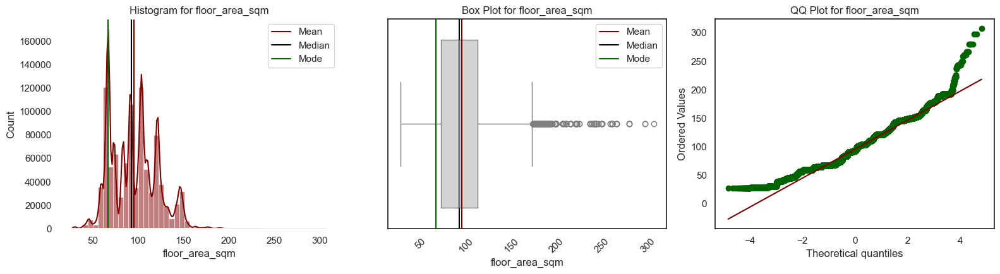



Skew for floor_area_sqm is 0.3661
Kurtosis for floor_area_sqm is -0.3464




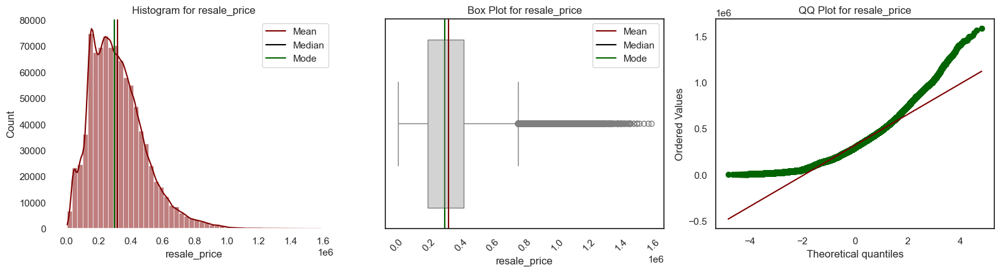



Skew for resale_price is 0.9422
Kurtosis for resale_price is 1.3735




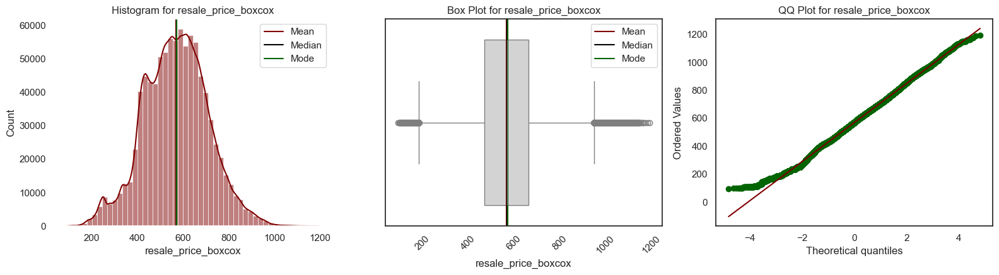



Skew for resale_price_boxcox is -0.0006
Kurtosis for resale_price_boxcox is 0.0481




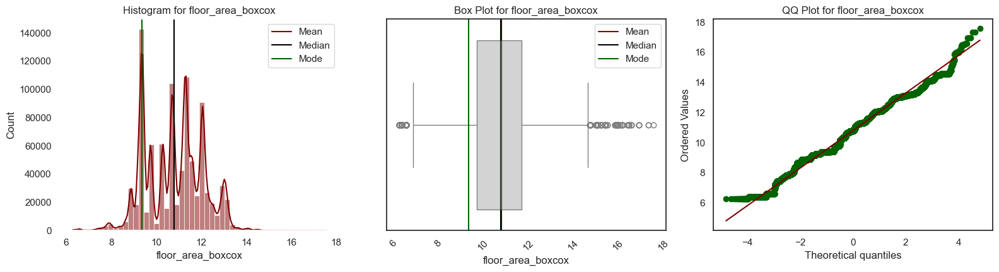



Skew for floor_area_boxcox is -0.0167
Kurtosis for floor_area_boxcox is -0.5553




In [68]:
skewed_col = []


for i in continuous:
    univar_num(df1,i) 
    skew_val = df1[i].skew()
    kurt=df1[i].kurtosis()
    kurt_color = kurtosis_color(kurt)
    color = skewness_color(skew_val)
    skewed_col.append(i)

    print(f"\n\n{color}Skew for {i} is {skew_val:.4f}{color_neutral}")
    print(f"{color}Kurtosis for {i} is {kurt:.4f}{color_neutral}\n\n")

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Floor Area SQM - Observations**</u></span><br><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%">After the Box-Cox transformation we can see a significant reduction in the Skewness. (almost 96%) addressed 95. </span><br>

<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%">The Box-Cox transformation slightly increased the negative kurtosis, indicating that the tails became even lighter. This might not be a significant concern. We will experiment the model's result and address this if we face any issues.  </span><br>

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Resale Price - Observations**</u></span><br><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;  </span> <span Style="color: white;font-size: 110%">The Box-Cox transformation appears to have been highly effective for Resale Price.</span><br>

### <span style="color:Khaki;">Outliers based on the Categorical Features:

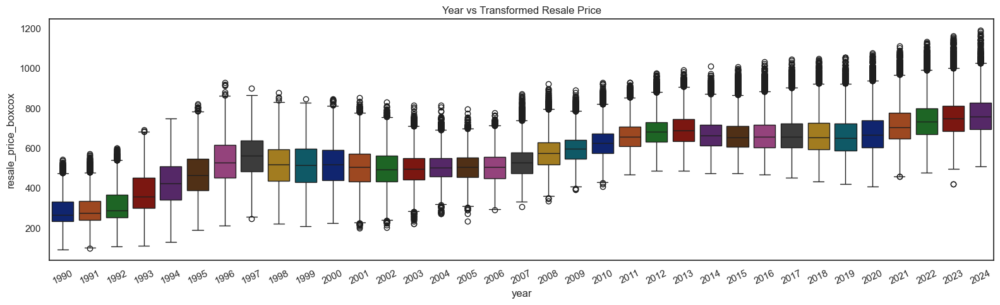

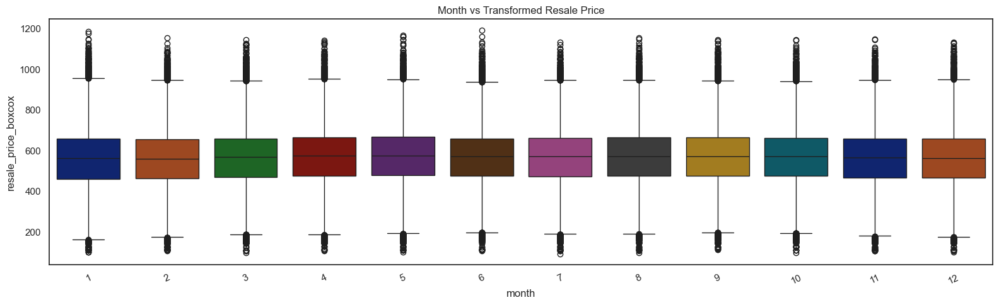

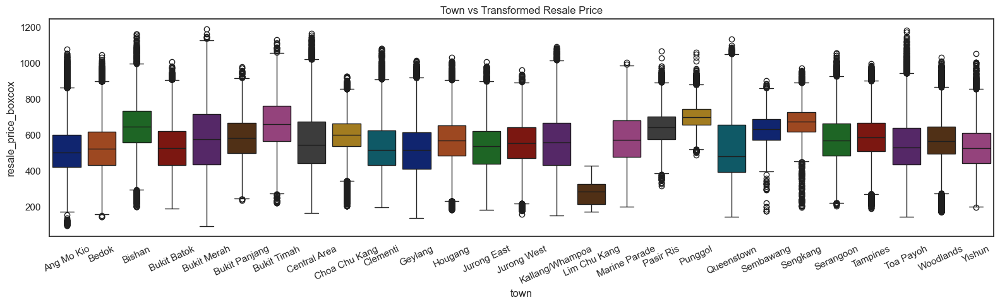

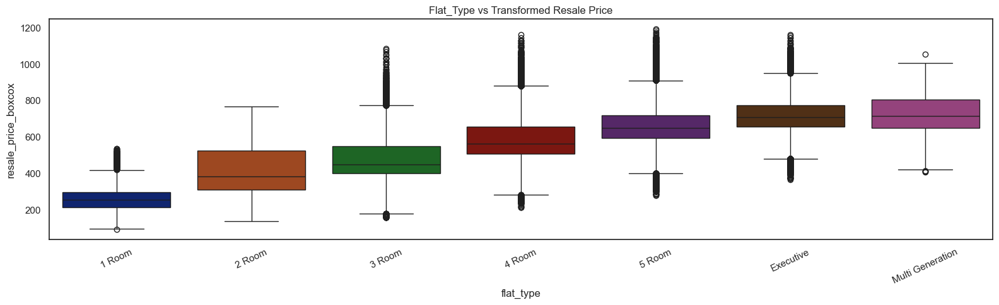

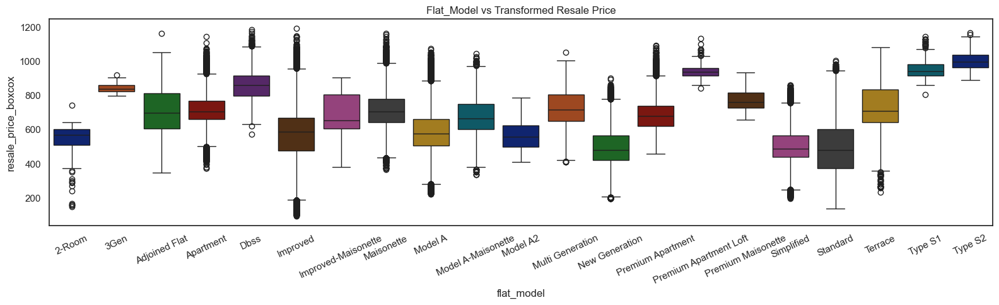

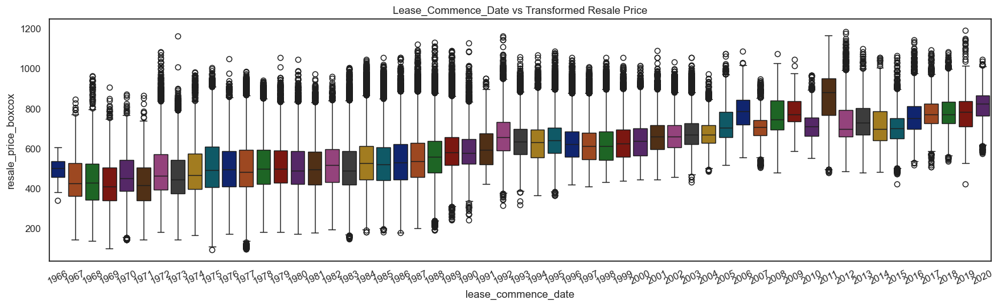

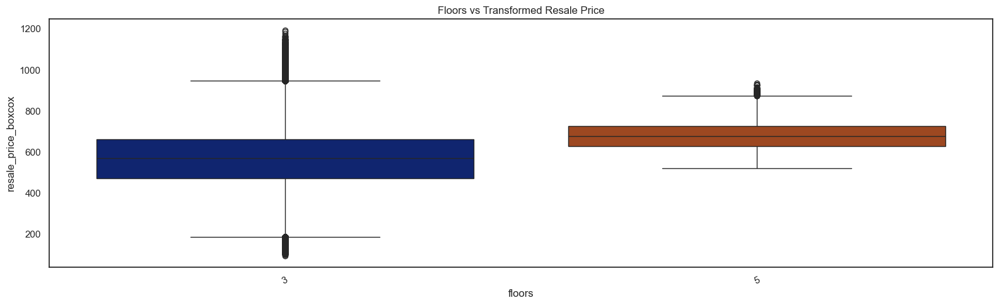

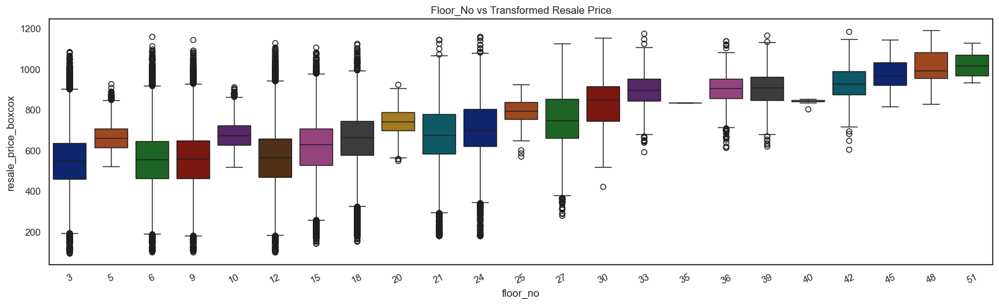

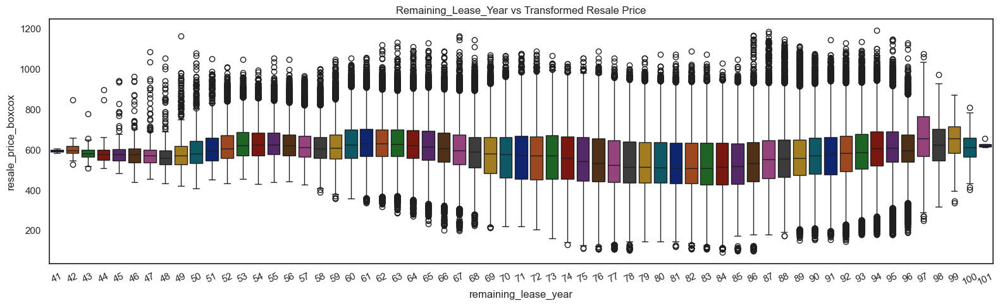

In [70]:
for i in categorical:
    plt.figure(figsize=(16,5))
    sns.boxplot(data=df1,x=i,y="resale_price_boxcox",hue=i,palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Transformed Resale Price')
    plt.tight_layout()
    plt.show()

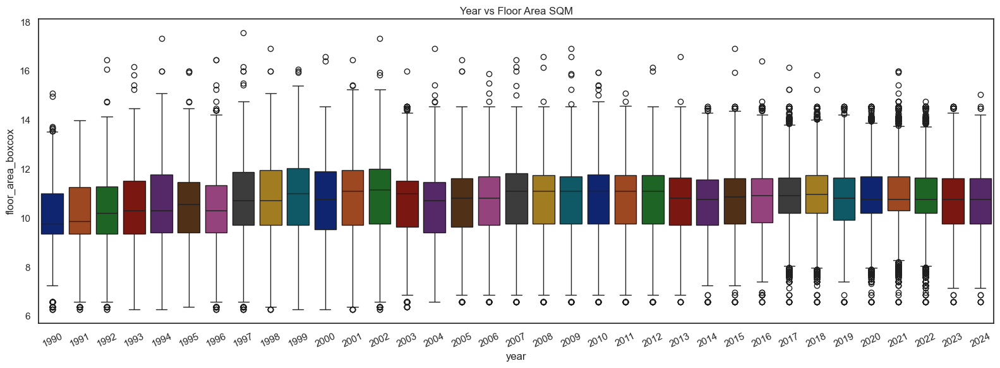

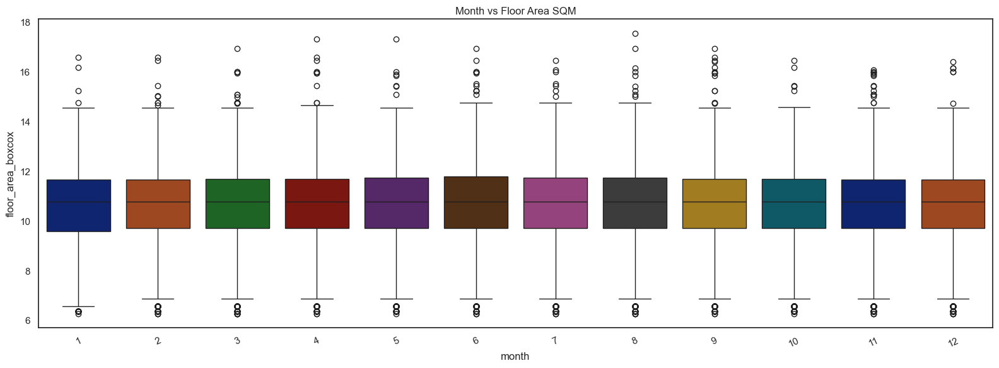

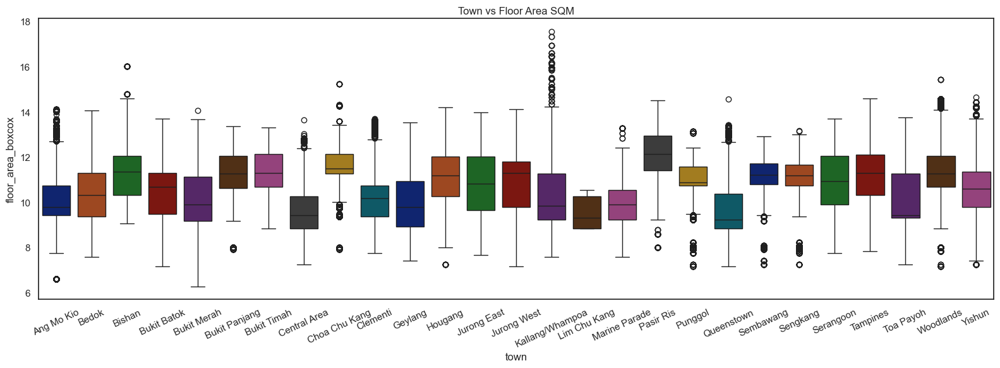

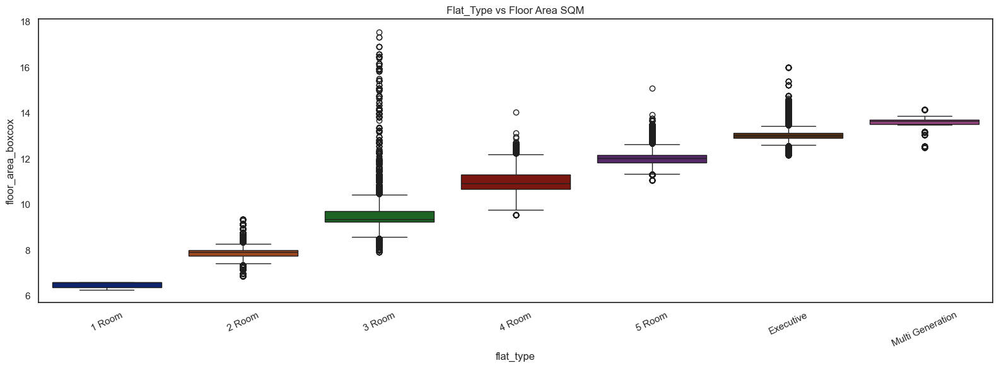

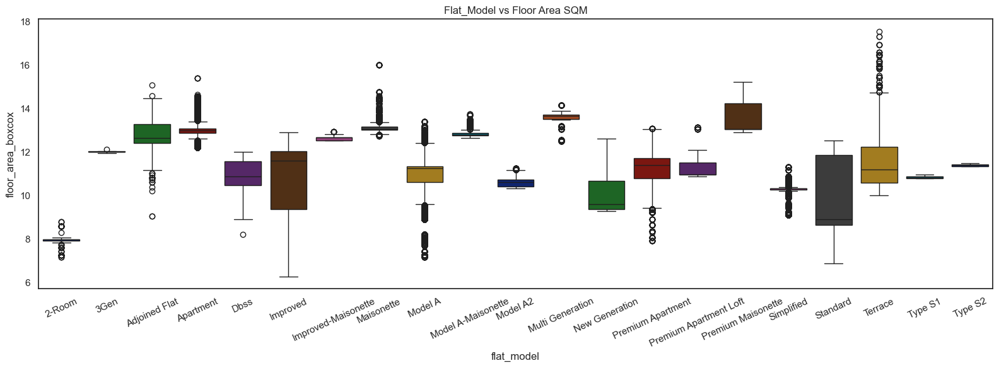

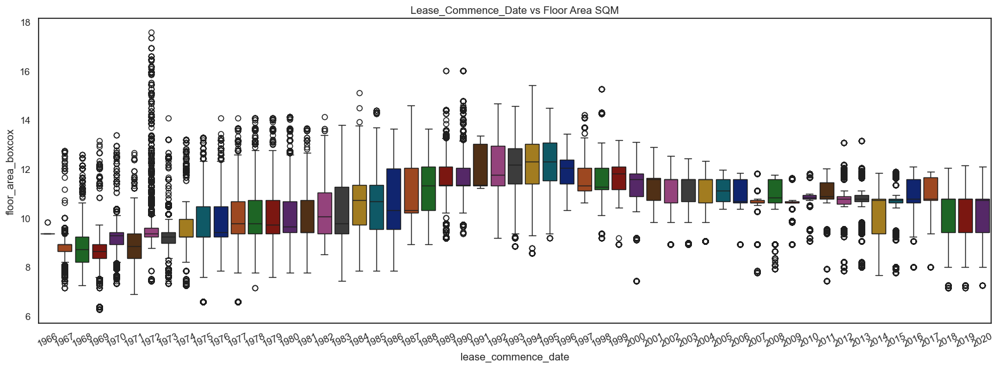

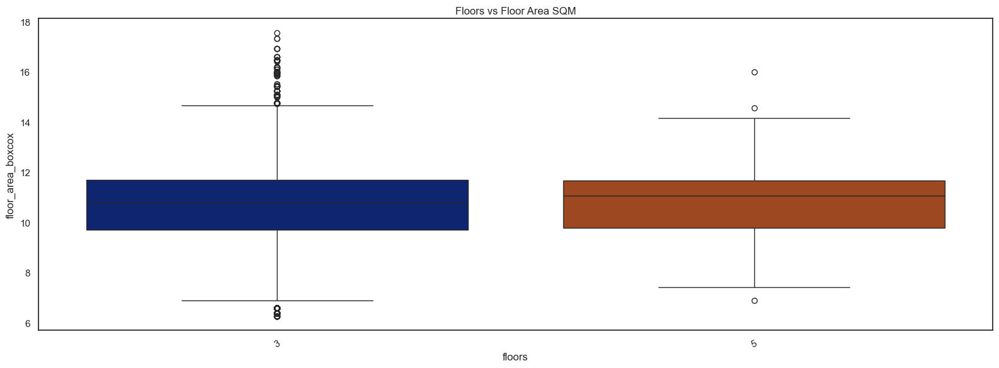

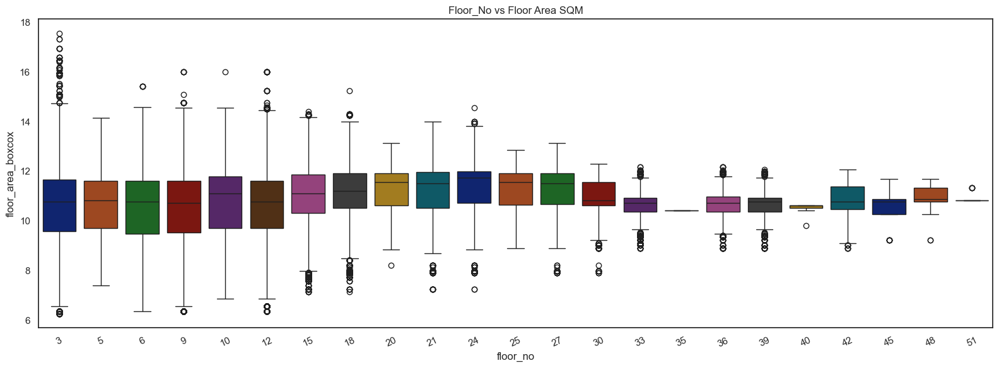

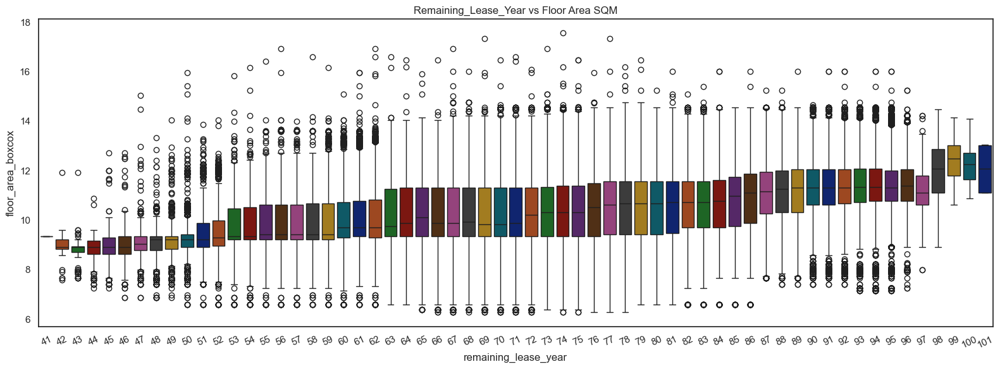

In [71]:
for i in categorical:
    plt.figure(figsize=(16,6))
    sns.boxplot(data=df1,x=i,y="floor_area_boxcox",hue=i,palette='dark',legend=False,)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Floor Area SQM')
    plt.tight_layout()
    plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **After data transformation we can see a distribution movement that spread outliers in the lower side as well as upper side. All of these data points are not an error it shows the higher floor area sqm, floor level, flat type and model that influencing the resae price.**</span>

In [25]:
for cat_var in categorical:
    analyze_categorical_relationship(df1, "resale_price_boxcox", cat_var)

NameError: name 'analyze_categorical_relationship' is not defined

In [76]:
for cat_var in categorical:
    analyze_categorical_relationship(df1, "floor_area_boxcox", cat_var)

Relationship between floor_area_boxcox and year:
ANOVA: F-statistic = 394.0159, p-value = 0.0000
year has 1.42% significance with floor_area_boxcox
There is a statistically significant relationship between year and floor_area_boxcox.

Relationship between floor_area_boxcox and month:
ANOVA: F-statistic = 20.2982, p-value = 0.0000
month has 0.02% significance with floor_area_boxcox
There is a statistically significant relationship between month and floor_area_boxcox.

Relationship between floor_area_boxcox and town:
ANOVA: F-statistic = 8968.9425, p-value = 0.0000
town has 20.09% significance with floor_area_boxcox
There is a statistically significant relationship between town and floor_area_boxcox.

Relationship between floor_area_boxcox and flat_type:
ANOVA: F-statistic = 1597598.9064, p-value = 0.0000
flat_type has 91.18% significance with floor_area_boxcox
There is a statistically significant relationship between flat_type and floor_area_boxcox.

Relationship between floor_area_boxc

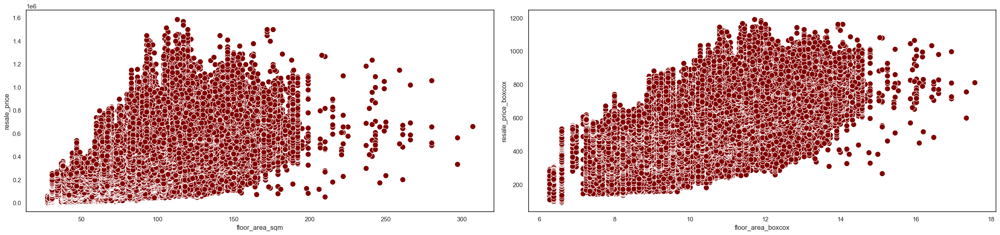

In [90]:
plt.figure(figsize=(25,6))
plt.subplot(1,2,1)
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", color='maroon',s=100)

plt.subplot(1,2,2)
sns.scatterplot(data=df1, x='floor_area_boxcox', y="resale_price_boxcox", color='maroon',s=100)
plt.tight_layout()
plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **We can oberseve that the top and bottom area data points reduced and formed almost like a linear relationship.**</span>

### <span style="color:Khaki;">Relationship Between Categorical Features and Target</span>

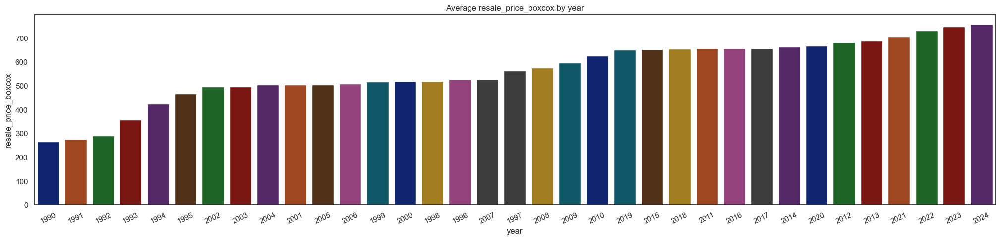

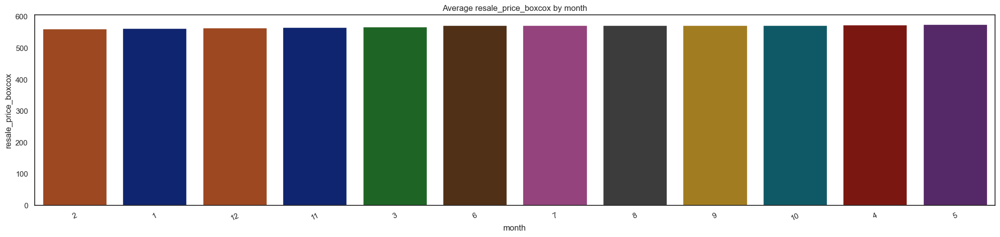

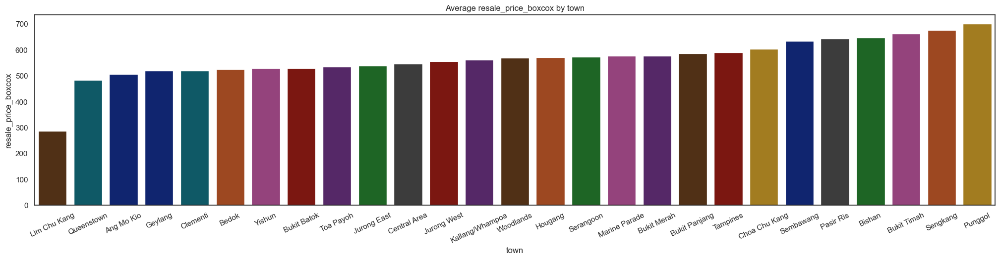

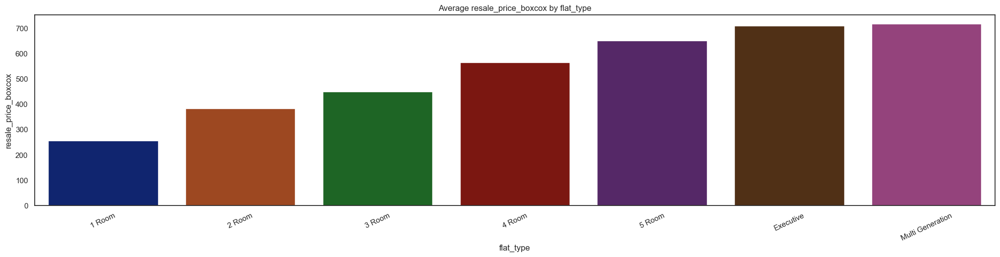

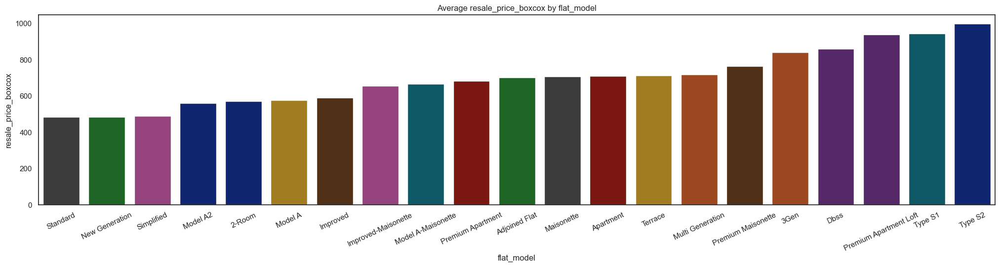

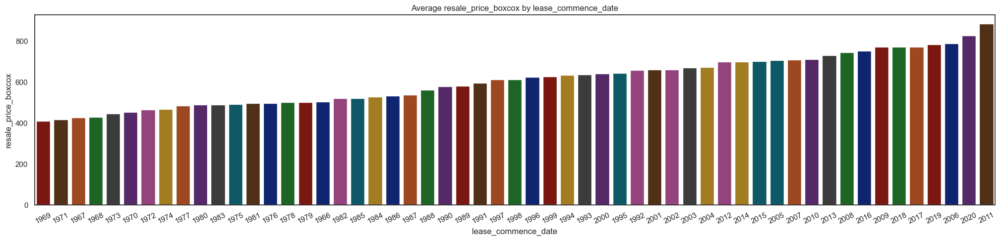

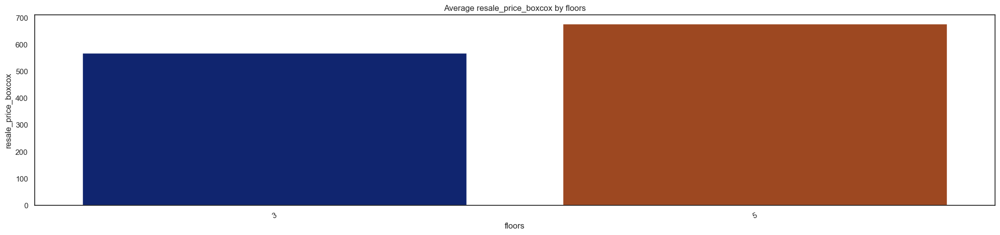

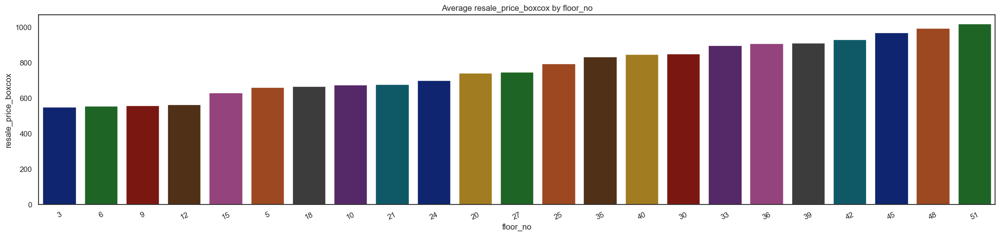

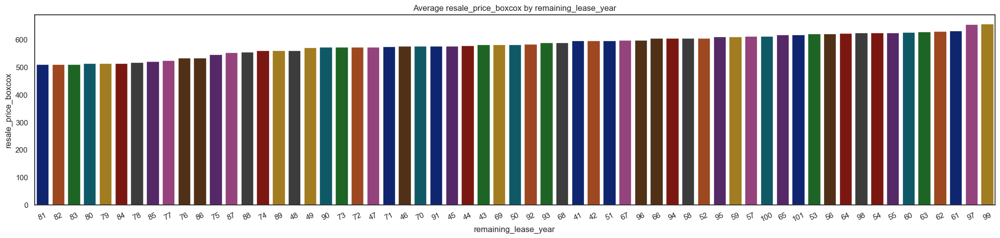

In [91]:
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['resale_price_boxcox'].median().reset_index().sort_values('resale_price_boxcox')
    sns.barplot(data=data, x=data[i], y=data['resale_price_boxcox'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average resale_price_boxcox by {i}')
    plt.show()

<span Style="color: DodgerBlue;font-size: 130%;"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b> Observations: </b> <br><span Style="color: DodgerBlue;font-size: 130%"> &nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span><span style="color: white;font-size: 110%">I feel that the fluctuations are curved when comparing to the original plots.</span>

### <p Style="color: Khaki">Correlation - Pearson's and Spearman's </p>

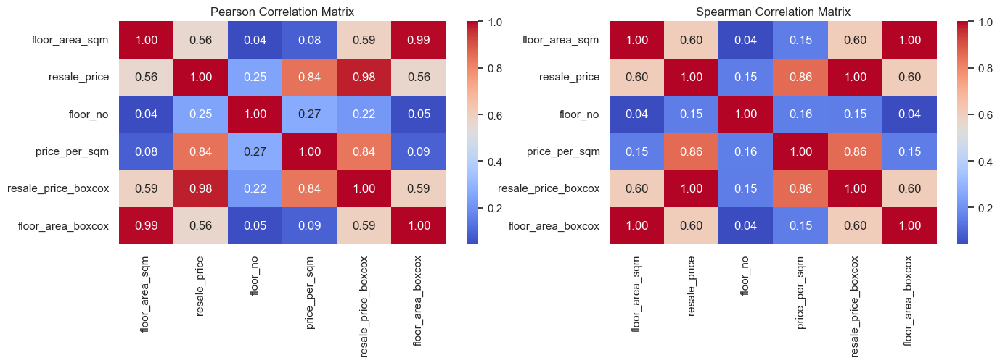

In [97]:
cor_col = df1.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Pearson Correlation Matrix')


cor_col = df1.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
plt.subplot(1,2,2)
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Spearman Correlation Matrix')
plt.show()

<span Style="color: DodgerBlue;font-size: 130%;"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b> Observations: </b> <br><span Style="color: DodgerBlue;font-size: 130%"> &nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span><span style="color: white;font-size: 110%">We do not see visible differences.</span>

## <span style="color:Khaki;"> Encoding Categorical Features:</span> 

In [138]:
town_en = df1.groupby('town',observed=False)['resale_price_boxcox'].median().rank(method='first').reset_index().sort_values('resale_price_boxcox')
town_en_list = dict(zip(town_en['town'], town_en['resale_price_boxcox'].astype(int)))
print(town_en_list)

{'Lim Chu Kang': 1, 'Queenstown': 2, 'Ang Mo Kio': 3, 'Clementi': 4, 'Geylang': 5, 'Bedok': 6, 'Bukit Batok': 7, 'Yishun': 8, 'Toa Payoh': 9, 'Jurong East': 10, 'Central Area': 11, 'Jurong West': 12, 'Kallang/Whampoa': 13, 'Woodlands': 14, 'Hougang': 15, 'Serangoon': 16, 'Marine Parade': 17, 'Bukit Merah': 18, 'Bukit Panjang': 19, 'Tampines': 20, 'Choa Chu Kang': 21, 'Sembawang': 22, 'Pasir Ris': 23, 'Bishan': 24, 'Bukit Timah': 25, 'Sengkang': 26, 'Punggol': 27}


In [149]:
df1['town_en'] = df1['town'].map(town_en_list)
df1['town_en'] = df1['town_en'].astype('int8')

In [125]:
year_en = df1.groupby('year',observed=False)['resale_price_boxcox'].median().rank(method='first').reset_index().sort_values('resale_price_boxcox')
year_en_list = dict(zip(year_en['year'], year_en['resale_price_boxcox'].astype(int)))
print(year_en_list)

{1990: 1, 1991: 2, 1992: 3, 1993: 4, 1994: 5, 1995: 6, 2002: 7, 2003: 8, 2004: 9, 2001: 10, 2005: 11, 2006: 12, 1999: 13, 2000: 14, 1998: 15, 1996: 16, 2007: 17, 1997: 18, 2008: 19, 2009: 20, 2010: 21, 2019: 22, 2015: 23, 2018: 24, 2011: 25, 2016: 26, 2017: 27, 2014: 28, 2020: 29, 2012: 30, 2013: 31, 2021: 32, 2022: 33, 2023: 34, 2024: 35}


In [147]:
df1['year_en'] = df1['year'].map(year_en_list)
df1['year_en'] = df1['year_en'].astype('int8')

In [129]:
flat_type_en = df1.groupby('flat_type',observed=False)['resale_price_boxcox'].median().rank(method='first').reset_index().sort_values('resale_price_boxcox')
flat_type_en_list = dict(zip(flat_type_en['flat_type'], flat_type_en['resale_price_boxcox'].astype(int)))
print(flat_type_en_list)

{'1 Room': 1, '2 Room': 2, '3 Room': 3, '4 Room': 4, '5 Room': 5, 'Executive': 6, 'Multi Generation': 7}


In [150]:
df1['flat_type_en'] = df1['flat_type'].map(flat_type_en_list)
df1['flat_type_en'] = df1['flat_type_en'].astype('int8')

In [132]:
flat_model_en = df1.groupby('flat_model',observed=False)['resale_price_boxcox'].median().rank(method='first').reset_index().sort_values('resale_price_boxcox')
flat_model_en_list = dict(zip(flat_model_en['flat_model'], flat_model_en['resale_price_boxcox'].astype(int)))
print(flat_model_en_list)

{'New Generation': 1, 'Standard': 2, 'Simplified': 3, 'Model A2': 4, '2-Room': 5, 'Model A': 6, 'Improved': 7, 'Improved-Maisonette': 8, 'Model A-Maisonette': 9, 'Premium Apartment': 10, 'Adjoined Flat': 11, 'Maisonette': 12, 'Apartment': 13, 'Terrace': 14, 'Multi Generation': 15, 'Premium Maisonette': 16, '3Gen': 17, 'Dbss': 18, 'Premium Apartment Loft': 19, 'Type S1': 20, 'Type S2': 21}


In [151]:
df1['flat_model_en'] = df1['flat_model'].map(flat_model_en_list)
df1['flat_model_en'] = df1['flat_model_en'].astype('int8')

In [27]:
lease_commence_en = df1.groupby('lease_commence_date',observed=False)['resale_price_boxcox'].median().rank(method='first').reset_index().sort_values('resale_price_boxcox')
lease_commence_en_list = dict(zip(lease_commence_en['flat_model'], lease_commence_en['resale_price_boxcox'].astype(int)))
print(lease_commence_en_list)

KeyError: 'Column not found: resale_price_boxcox'

In [152]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 927465 entries, 0 to 181261
Data columns (total 19 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   month                 927465 non-null  category
 1   town                  927465 non-null  category
 2   flat_type             927465 non-null  category
 3   floor_area_sqm        927465 non-null  float64 
 4   flat_model            927465 non-null  category
 5   lease_commence_date   927465 non-null  category
 6   resale_price          927465 non-null  float64 
 7   floors                927465 non-null  category
 8   floor_no              927465 non-null  int8    
 9   year                  927465 non-null  category
 10  full_address          927465 non-null  category
 11  price_per_sqm         927465 non-null  float64 
 12  remaining_lease_year  927465 non-null  category
 13  resale_price_boxcox   927465 non-null  float64 
 14  floor_area_boxcox     927465 non-null  fl

In [153]:
for i in df1.columns:
    if '_en' in i:
        print(i)
        print(f"Max - {df1[i].max()}\n {df1[i].min()}" )
    else:
        print('else - ',i )

else -  month
else -  town
else -  flat_type
else -  floor_area_sqm
else -  flat_model
else -  lease_commence_date
else -  resale_price
else -  floors
else -  floor_no
else -  year
else -  full_address
else -  price_per_sqm
else -  remaining_lease_year
else -  resale_price_boxcox
else -  floor_area_boxcox
town_en
Max - 27
 1
year_en
Max - 35
 1
flat_type_en
Max - 7
 1
flat_model_en
Max - 21
 1


In [136]:
df1.sample(10)

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,floors,floor_no,year,full_address,price_per_sqm,remaining_lease_year,resale_price_boxcox,floor_area_boxcox,town_en,year_en,flat_type_en,flat_model_en
41876,3,Hougang,5 Room,121.0000,Improved,1987,330000.0000,3,6,2001,527 Hougang Ave 6 Hougang,2727.2727,85,597.7745,12.0465,15,10,5,7
365265,12,Bukit Panjang,4 Room,85.0000,Model A2,2002,395000.0000,3,6,2011,618 Senja Rd Bukit Panjang,4647.0588,90,647.0046,10.3740,19,25,4,4
177128,4,Kallang/Whampoa,4 Room,94.0000,New Generation,1981,568000.0000,3,12,2024,102 Jln Rajah Kallang/Whampoa,6042.5532,56,759.1309,10.8301,13,35,4,1
241476,3,Clementi,4 Room,91.0000,New Generation,1981,246000.0000,3,12,1999,381 Clementi Ave 5 Clementi,2703.2967,81,525.2405,10.6814,4,13,4,1
41081,2,Ang Mo Kio,5 Room,120.0000,Improved,1980,170000.0000,3,6,1993,459 Ang Mo Kio Ave 10 Ang Mo Kio,1416.6667,86,446.3168,12.0048,3,4,5,7
68357,4,Yishun,5 Room,121.0000,Improved,1987,253000.0000,3,9,1994,624 Yishun Ring Rd Yishun,2090.9091,92,531.7719,12.0465,8,5,5,7
23892,5,Bedok,4 Room,92.0000,New Generation,1985,433000.0000,3,6,2016,42 Chai Chee St Bedok,4706.5217,68,673.6937,10.7313,6,26,4,1
27825,7,Choa Chu Kang,4 Room,110.0000,Model A,1990,353000.0000,3,9,2016,237 Choa Chu Kang Ctrl Choa Chu Kang,3209.0909,73,615.7697,11.5749,21,26,4,6
364254,11,Queenstown,5 Room,111.0000,Improved,2003,745000.0000,3,24,2011,17 Dover Cres Queenstown,6711.7117,91,855.3212,11.6190,2,25,5,7
126084,8,Queenstown,3 Room,65.0000,Improved,1974,180000.0000,3,18,2003,2 Holland Ave Queenstown,2769.2308,70,457.7041,9.2331,2,8,3,7


## <span style="color:Khaki;"> Splitting train and test Data:</span> 

In [114]:
df1.columns

Index(['month', 'town', 'flat_type', 'floor_area_sqm', 'flat_model',
       'lease_commence_date', 'resale_price', 'floors', 'floor_no', 'year',
       'full_address', 'price_per_sqm', 'remaining_lease_year',
       'resale_price_boxcox', 'floor_area_boxcox'],
      dtype='object')

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(df1.drop(['month','price_per_sqm','remaining_lease_year','resale_price_boxcox', ], axis=1), df6[['transformed_status']].values.ravel(), test_size=0.2, random_state=42)